# CLUSTERING OF TIME SERIES

To approach the clustering problem for a time series, the following is done:
* Exploratory Data Analysis (EDA)
* Information preprocessing
* The techniques used in the Machine Learning II course.

In [99]:
#Importing the necessary packages
#Data analysis and visualization libraries
import pandas as pd
import numpy as np

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Plotting libraries
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.patches import ConnectionPatch

#Outlier detection libraries
from sklearn.neighbors import LocalOutlierFactor # LOF Algorithm
from sklearn.covariance import EllipticEnvelope # Covariance Estimation
from scipy.special import entr # Shannon Entropy
from scipy.stats import median_abs_deviation, iqr, multivariate_normal # MAD, Interquartile range and Multivariate Gaussian Distribution

#Machine Learning Libraries
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering, DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

#Time Series Libraries
import time
try:
    from tslearn.clustering import TimeSeriesKMeans
    from tslearn.clustering import silhouette_score
except:
    import sys
!{sys.executable} -m pip install tslearn
from tslearn.clustering import TimeSeriesKMeans
from tslearn.clustering import silhouette_score

#Distance and Similarity Metrics Libraries
import scipy.spatial.distance as dist

"{sys.executable}" no se reconoce como un comando interno o externo,
programa o archivo por lotes ejecutable.


In [100]:
# Methods
def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape
    
    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)

In [101]:
# Read Dataset
df = pd.read_excel(r"Pronosticos_.xlsx",sheet_name="ConFecha")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78889 entries, 0 to 78888
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   semana            78889 non-null  object 
 1   Codmat            78889 non-null  object 
 2   cant              78889 non-null  float64
 3   semanacalendario  78889 non-null  float64
dtypes: float64(2), object(2)
memory usage: 2.4+ MB


In [102]:
df.semanacalendario =df.semanacalendario.astype('str')
df.head()

,semana,Codmat,cant,semanacalendario
0,2020-03-02,NN13-1000497,1891.000,2020.1
1,2020-03-02,NN13-1000498,544.333,2020.1
2,2020-03-02,NN13-1000794,4370.000,2020.1
3,2020-03-02,NN13-1000814,10.000,2020.1
4,2020-03-02,NN13-1000820,489.500,2020.1


In [103]:
#Correction of the calendar week and addition of the center and material.
df.semanacalendario = df.semanacalendario.apply(\
    lambda x: x + '0' if len(x.split('.')[-1]) == 1 else x)
df['centro']= df.Codmat.str.split('-').str[0]
df['material']= df.Codmat.str.split('-').str[1]

In [104]:
print("Number of periods: ", len(df.semanacalendario.unique()))
print("Number of centers: ", len(df.centro.unique()))
print("Amount of materials: ", len(df.material.unique()))
print("Number of Center - Material Combinations: ", len(df.Codmat.unique()))

Number of periods:  155
Number of centers:  14
Amount of materials:  77
Number of Center - Material Combinations:  694


Proceed with Descriptive Analysis, to understand the behavior of the data.

In [105]:
df_columns= df.copy()

A copy of the dataframe is created and characteristics such as Center, Week Number, Corrected Week, Material, Year, and Month are added.

In [106]:
df_columns['centro']=df_columns['Codmat'].apply(lambda x: x.split('-')[0])
df_columns['numeroSemana']=df_columns['semanacalendario'].apply(lambda x: x.split('.')[1])
df_columns['Semana Corregida']=pd.to_datetime(df_columns['semana'])
df_columns['material']=df_columns['Codmat'].apply(lambda x: x.split('-')[1])
df_columns['year'] = df_columns['Semana Corregida'].dt.year
df_columns['mes'] = df_columns['Semana Corregida'].dt.month

The completeness of the series will be analyzed. For this, the analysis will be done both by Codmat and by material. This completeness will not be investigated by center, since we would be adding the different BMUs of the materials, and this would not make sense for a final decision to limit the problem.

### Analysis by Material

In [107]:
df_material = df.groupby(['material', 'semana'])['cant'].sum().reset_index()
df_material

,material,semana,cant
0,1000031,2020-03-02,4553.695
1,1000031,2020-03-09,5492.006
2,1000031,2020-03-16,3870.255
3,1000031,2020-03-23,2284.952
4,1000031,2020-03-30,4020.223
...,...,...,...
9197,1061857,2023-01-16,448.000
9198,1061857,2023-01-23,1905.000
9199,1061857,2023-01-30,2937.000
9200,1061857,2023-02-06,1071.000


In [108]:
# The table is restructured to measure the completeness of the series.
df_material_restructured=df_material.pivot(index='semana',columns="material",values='cant')
df_material_restructured

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1050413,1050702,1051543,1051544,1053497,1054251,1054252,1055778,1055779,1061857
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,4553.695,2347.000,548.333,5981.0,24.0,14861.851,7356.609,4503.815,3573.975,2498.545,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-09,5492.006,1822.000,1095.333,5012.0,24.0,20152.220,8500.055,6022.121,4475.146,3671.445,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-16,3870.255,3676.000,310.000,6980.0,54.0,17591.170,10662.832,2794.617,3850.982,2206.495,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-23,2284.952,3771.000,220.334,8112.0,55.0,12575.380,7451.010,962.701,4442.017,934.211,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-30,4020.223,3540.000,348.333,7770.0,40.0,14922.400,10086.938,1370.585,5302.665,1392.940,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,5917.500,2829.625,1180.000,1768.0,56.0,19041.167,13601.722,5955.619,5770.000,5275.000,...,NaN,NaN,477.00,NaN,26722.817,5542.000,2548.0,35.0,NaN,448.0
2023-01-23,5024.438,2208.000,319.667,1362.0,40.0,16314.000,12550.486,4863.438,4954.501,3554.500,...,NaN,NaN,600.00,NaN,17816.908,4244.000,1909.0,NaN,0.25,1905.0
2023-01-30,4574.348,3158.000,484.333,1944.0,40.0,17300.000,13762.514,4977.264,4293.500,2934.500,...,NaN,NaN,532.00,1.0,20436.179,5149.000,2528.0,NaN,NaN,2937.0


### EDA

The exploratory analysis of the dataset is performed

In [109]:
df_material_restructured.describe()

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1050413,1050702,1051543,1051544,1053497,1054251,1054252,1055778,1055779,1061857
count,155.000000,155.000000,153.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,153.000000,...,12.000000,12.000000,56.000000,75.000000,64.000000,83.000000,83.000000,31.000000,26.000000,22.000000
mean,4599.350084,2276.308084,588.019601,2551.757677,52.128394,9423.697710,11305.364200,4732.535135,4787.227639,3524.878641,...,1.977167,6.135417,291.075982,4.644667,19726.792406,4470.847108,1922.632289,5469.871742,1531.128538,1789.500000
std,1159.853337,463.818383,198.070347,1042.661689,19.122089,6440.584754,1856.312963,1618.255781,636.665763,930.152020,...,0.467961,1.418685,265.700396,3.820252,2738.231218,718.743486,636.029493,4276.877149,1704.353586,1233.459546
min,1660.490000,1489.608000,138.334000,1176.000000,9.000000,2490.437000,7183.280000,962.701000,3572.226000,934.211000,...,1.333000,3.500000,6.000000,1.000000,3937.000000,1955.858000,554.782000,1.000000,0.250000,275.000000
25%,3460.043500,1905.300500,471.332000,1955.500000,40.000000,4021.195500,9937.511000,3269.679000,4320.973000,2906.048000,...,1.567000,5.843750,43.004000,2.000000,19001.860500,4179.104500,1662.000000,1583.000000,246.187500,769.000000
50%,4849.459000,2226.000000,561.721000,2374.000000,50.000000,4891.054000,11392.500000,5269.500000,4701.500000,3658.445000,...,2.002500,6.562500,214.821000,4.243000,20052.043500,4464.263000,1969.000000,4076.000000,821.875000,1520.500000
75%,5536.347000,2607.000000,686.193000,2754.000000,60.515500,17110.297500,12491.687500,6016.272000,5159.844000,4127.578000,...,2.031000,7.250000,548.070000,5.520000,20768.679500,4918.715500,2397.500000,7935.000000,2120.062500,2932.500000
max,6927.294000,3771.000000,1180.000000,8112.000000,123.000000,20712.000000,17395.500000,8138.000000,6824.315000,5837.500000,...,3.071000,7.250000,717.402000,19.000000,26722.817000,6280.000000,3273.000000,13658.000000,5965.750000,4141.000000


Box plot

In [110]:
# Create the box plot
fig = px.box(df_material_restructured )

# Update the layout
fig.update_layout(title='Unnormalized boxplot',xaxis_title='Material',yaxis_title='UMB')

# Display the plot
fig.show()

It is observed that there are large differences in the scale of the values of each characteristic. To improve the visualization of the data, a normalization is applied:

In [111]:
df_material_Normalize = (df_material_restructured - df_material_restructured.min())/(df_material_restructured.max() - df_material_restructured.min())

In [112]:
# Create the box plot
fig = px.box(df_material_Normalize)

# Update the layout
fig.update_layout(title='Example normalize',xaxis_title='Material',yaxis_title='UMB',height=450)

# Display the plot
fig.show()

By normalizing the BD, we found that there are materials that have a large number of outliers. Most of the possible outliers are found in the upper part of the boxplot, that is, after the 75th percentile. A description will be made to understand some statistics of the data.

In [113]:
df_material_Normalize.describe()

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1050413,1050702,1051543,1051544,1053497,1054251,1054252,1055778,1055779,1061857
count,155.000000,155.000000,153.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,153.000000,...,12.000000,12.000000,56.000000,75.000000,64.000000,83.000000,83.000000,31.000000,26.000000,22.000000
mean,0.557997,0.344833,0.431698,0.198350,0.378319,0.380498,0.403642,0.525391,0.373607,0.528353,...,0.370637,0.702778,0.400724,0.202481,0.692966,0.581616,0.503216,0.400445,0.256622,0.391749
std,0.220220,0.203305,0.190148,0.150326,0.167738,0.353460,0.181774,0.225531,0.195771,0.189700,...,0.269252,0.378316,0.373488,0.212236,0.120173,0.166216,0.233988,0.313164,0.285702,0.319053
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.341678,0.182210,0.319678,0.112385,0.271930,0.084008,0.269700,0.321517,0.230236,0.402146,...,0.134638,0.625000,0.052016,0.055556,0.661151,0.514147,0.407332,0.115838,0.041227,0.127781
50%,0.605485,0.322782,0.406452,0.172722,0.359649,0.131746,0.412175,0.600226,0.347246,0.555593,...,0.385213,0.816667,0.293534,0.180167,0.707240,0.580093,0.520274,0.298382,0.137729,0.322168
75%,0.735903,0.489785,0.525945,0.227509,0.451890,0.802338,0.519809,0.704301,0.488184,0.651270,...,0.401611,1.000000,0.761974,0.251111,0.738691,0.685190,0.677914,0.580947,0.355345,0.687403
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Initially, you can see that there are materials with missing data. Later, you will need to decide how to allocate these materials or how to purge them from the BD.

In [114]:
data = df_material_Normalize

traces = []
for i, d in enumerate(data):
    trace = go.Violin(y=list(d), name=d)
    traces.append(trace)

fig = go.Figure(data=traces)

fig.update_layout(title='Violin graphic',
                  yaxis_title='Value')

fig.show()


For most materials, a symmetry in the data distribution can be observed, indicating that the behavior of these materials is approximately normal.

On the other hand, there are materials that show asymmetries in the density of their distribution, such as the following materials: ['1000031','1000820','1000833','1000840','1000900','1000911', '1001014,'1001311','1012331','1031533','1031534','1034132','1038034','1044346','1043643','1045313','1050413']

Outlier handling is performed. Outlier analysis refers to the identification and treatment of outliers in a data set, which can be errors or extreme values that negatively affect the analysis of the data. It is important to perform this analysis before imputing missing values, as outliers can affect the distribution and relationships between variables and therefore the imputation method.

## Interquartile range for detection of outliers

In [115]:
names = df_material_Normalize.columns

The interquartile range method is a method for detecting outliers from the difference between the first (25%) and the third quartile (75%), which allows 50% of the data to be covered.

$IQR = Q3 - Q1$

In [116]:
IQR = iqr(df_material_Normalize, axis = 0, rng = (25, 75), interpolation = 'midpoint')

In [117]:
# We calculate the quartile deviation, which is half the IQR:
DC = IQR/2 

The quartile deviation allows us to observe which region of the data is outside the IQR (it can be visualized with the box plot). Now we will calculate the interquartile bounds, which are $Q1 - 1.5*IQR$ and $Q3 + 1.5*IQR$. The value 1.5 allows us to establish a distance between the Q1 and Q3 quartiles with respect to the top and bottom of a box representing the data.

In [118]:
Q1 = np.percentile(df_material_Normalize, 25, axis = 0, interpolation = 'midpoint')
Q3 = np.percentile(df_material_Normalize, 75, axis = 0, interpolation = 'midpoint')

Min_Limite = Q1 - 1.5*IQR
Max_Limite = Q3 + 1.5*IQR

In [119]:
outliers = [[] for _ in range(df_material_Normalize.shape[1])]
post_outliers = [[] for _ in range(df_material_Normalize.shape[1])]

for i in range(df_material_Normalize.shape[1]):
    for j in range(df_material_Normalize.shape[0]):
        if df_material_Normalize.iloc[j, i] < Min_Limite[i] or df_material_Normalize.iloc[j, i] > Max_Limite[i]:
            outliers[i].append(df_material_Normalize.iloc[j, i])
            post_outliers[i].append(j)

Number_outliers = [len(outliers[i]) for i in range(len(outliers))]
report = pd.DataFrame(Number_outliers, index=names, columns=['Number Outliers'])
display(report) 

,Number Outliers
material,
1000031,0
1000497,2
1000498,0
1000794,11
1000812,7
...,...
1054251,0
1054252,0
1055778,0


array([[<Axes: title={'center': 'Number Outliers'}>]], dtype=object)

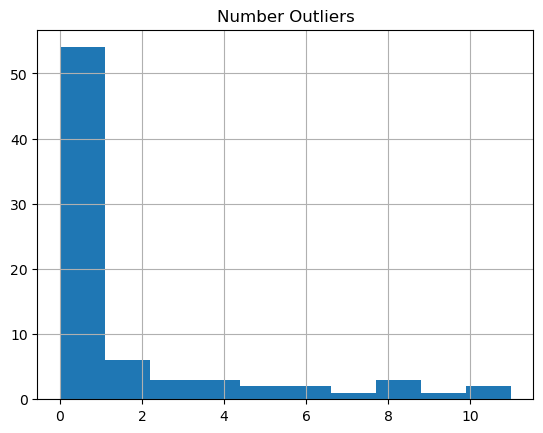

In [120]:
report.hist()

It is decided to perform upper and lower tamponade, so as not to eliminate periods of time

In [121]:
data_tamponade = df_material_Normalize.copy()

cols = names
for i,col in enumerate(cols):
    data_tamponade[col] = np.where(data_tamponade[col] > Max_Limite[i], Max_Limite[i],
                                np.where(data_tamponade[col] < Min_Limite[i], Min_Limite[i], data_tamponade[col]))


In [122]:
# Create the box plot
fig = px.box(data_tamponade)

# Update the layout
fig.update_layout(title='Tamponade data',xaxis_title='Material',yaxis_title='UMB',height=450)

# Display the plot
fig.show()

The algorithm performed the plugging of materials that do not have zeroes. The materials that have the data of the incomplete series were not affected, since their minimum and maximum limits are nan. These will be studied after possible cleaning.

In [123]:
print("Material lower limits 2= ", Min_Limite[2])
print("Material upper limits 2 = ", Max_Limite[2])
print("Material lower limits 72 = ", Min_Limite[72])
print("Material upper limits 72 = ", Max_Limite[72])

Material lower limits 2=  nan
Material upper limits 2 =  nan
Material lower limits 72 =  nan
Material upper limits 72 =  nan


In [124]:
dfa_material_without_out=data_tamponade.copy()

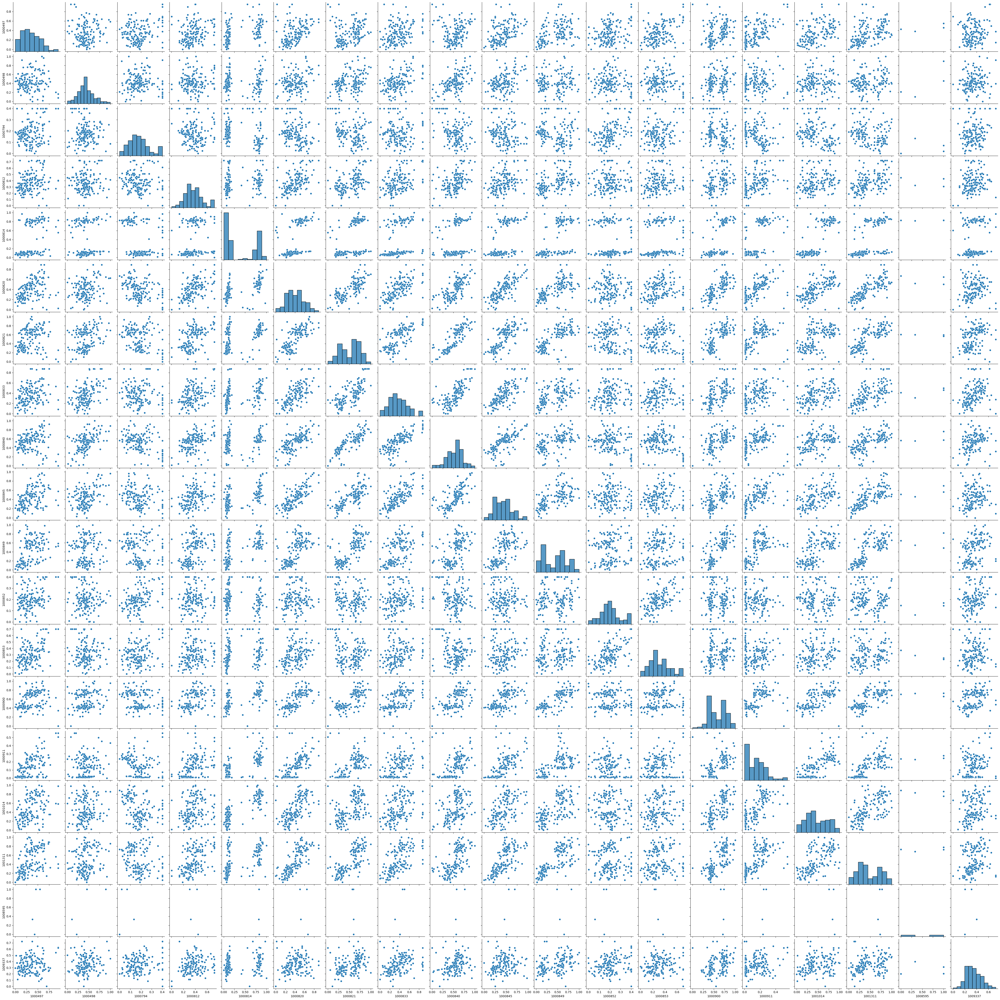

In [125]:
sns.pairplot(dfa_material_without_out.iloc[:,1:20])

In the dispersion matrix, we can show materials that have a fairly acceptable data quality, surely because they are complete or by aggregating the data by all centers, it has not affected their distribution as such.

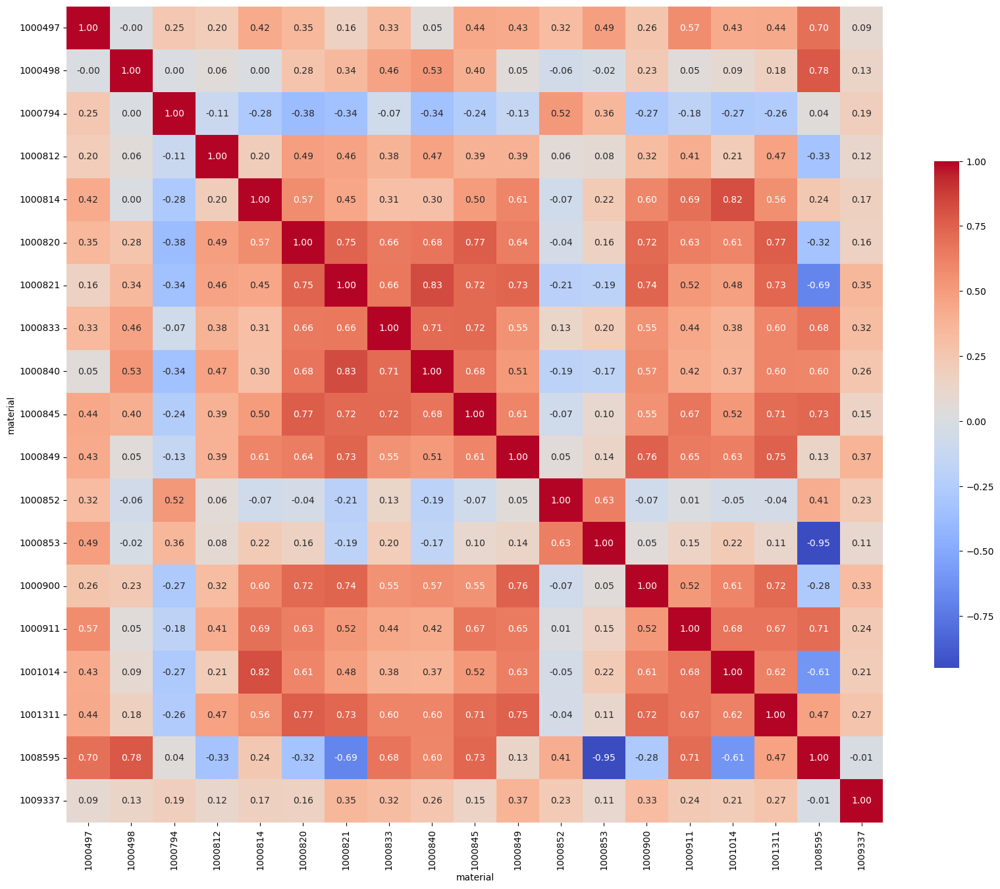

In [126]:
correlation=dfa_material_without_out.iloc[:,1:20].corr(method='pearson')
g=sns.heatmap(correlation,square=True,cbar_kws={"shrink": .5},annot=True,fmt='.2f',cmap="coolwarm")
g.figure.set_size_inches(20,20)

plt.show()

The first 20 materials have been analyzed to understand how these materials correlate with each other over the weeks. Strong correlations between different products are evident, which could provide signals for subsequent clustering.

Strong negative correlations appear for materials with missing data.

<Axes: xlabel='material', ylabel='semana'>

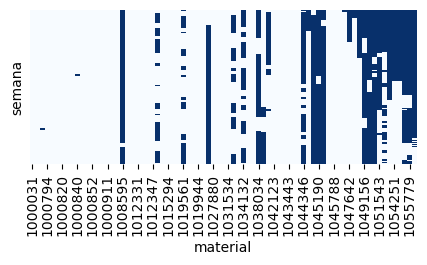

In [127]:
# identify missing data series (dark blue areas with missing data)
plt.subplots(figsize=(5, 2))
sns.heatmap(dfa_material_without_out.isnull(), yticklabels=False, cbar=False, cmap = "Blues")

In [128]:
null_materiales =pd.DataFrame(dfa_material_without_out.isnull().sum()).reset_index()
null_materiales = null_materiales[null_materiales[0] >0]
null_materiales["Porcentaje/Periodos"] = null_materiales[0]/len(df.semanacalendario.unique())*100
null_materiales = null_materiales.rename(columns={0:'cantidadPeriodosVacios'})
null_materiales= null_materiales.sort_values(by='Porcentaje/Periodos',ascending=False)
null_materiales

,material,cantidadPeriodosVacios,Porcentaje/Periodos
18,1008595,151,97.419355
56,1045189,150,96.774194
58,1045313,148,95.483871
57,1045190,147,94.838710
68,1050702,143,92.258065
67,1050413,143,92.258065
35,1027839,139,89.677419
76,1061857,133,85.806452
66,1049156,130,83.870968
75,1055779,129,83.225806


<Axes: >

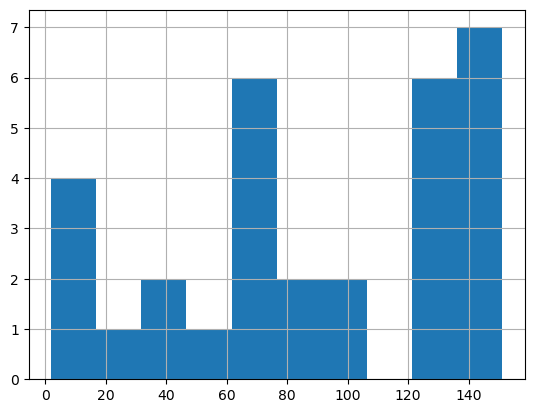

In [129]:
null_materiales.cantidadPeriodosVacios.hist()

In [130]:
print("Amount of materials that have at least one empty period: ", len(null_materiales.material.unique()))
print("Percentage of materials that have at least one empty period: ",\
                  len(null_materiales.material.unique())/len(df.material.unique())*100)
print("Amount of materials that have more than 30% of the empty periods: ",\
                  len(null_materiales[null_materiales["Porcentaje/Periodos"]>30].material.unique()))
print("Percentage of materials that have more than 30% of empty period: ",\
                  len(null_materiales[null_materiales["Porcentaje/Periodos"]>30].material.unique())/len(df.material.unique())*100)


Amount of materials that have at least one empty period:  31
Percentage of materials that have at least one empty period:  40.25974025974026
Amount of materials that have more than 30% of the empty periods:  24
Percentage of materials that have more than 30% of empty period:  31.16883116883117


In [131]:
null_materiales[null_materiales["Porcentaje/Periodos"]>30].material.unique()

array(['1008595', '1045189', '1045313', '1045190', '1050702', '1050413',
       '1027839', '1061857', '1049156', '1055779', '1038034', '1044346',
       '1055778', '1051543', '1034132', '1053497', '1051544', '1032538',
       '1013553', '1054252', '1054251', '1019561', '1041047', '1048519'],
      dtype=object)

The materials ['1008595', '1045189', '1045313', '1045190', '1050702', '1050413',
       '1027839', '1061857', '1049156', '1055779', '1038034', '1044346',
       '1055778', '1051543', '1034132', '1053497', '1051544', '1032538',
       '1013553', '1054252', '1054251', '1019561', '1041047', '1048519'] have more than 30% of the periods with null data

The same analysis will be done for the CodMat combination

In [132]:
#restructure the table
df_restructured=df.pivot(index='semana',columns="Codmat",values='cant')
df_restructured

Codmat,NN13-1000497,NN13-1000498,NN13-1000794,NN13-1000814,NN13-1000820,NN13-1000821,NN13-1000833,NN13-1000840,NN13-1000845,NN13-1000849,...,NNB8-1045787,NNB8-1046292,NNB8-1047173,NNB8-1047642,NNB8-1047909,NNB8-1049156,NNB8-1053497,NNB8-1054251,NNB8-1055778,NNB8-1055779
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,1891.0,544.333,4370.0,10.0,489.5,56.0,976.500,56.0,1842.0,433.000,...,126.0,1301.854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-09,1393.0,1095.333,3421.0,20.0,782.5,70.0,1177.000,150.0,2863.0,371.000,...,203.0,1334.426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-16,2639.0,305.000,4253.0,31.0,354.0,66.0,515.500,45.5,1543.0,796.000,...,159.0,1880.568,13.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-23,2957.0,220.334,6052.0,24.0,564.0,80.0,950.000,58.0,2294.0,723.000,...,1.0,1829.283,11.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-03-30,2680.0,347.333,4788.0,9.0,462.5,44.0,907.000,45.5,1805.0,589.000,...,107.0,1541.282,7.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,1869.0,1180.000,1134.0,NaN,667.5,68.0,1584.500,81.0,4589.0,562.000,...,631.0,1712.995,144.871,161.0,NaN,NaN,534.909,30.0,NaN,NaN
2023-01-23,1573.0,319.667,866.0,30.0,636.5,177.0,1270.438,118.0,2134.0,461.757,...,331.0,1476.067,121.012,72.0,NaN,NaN,389.909,39.0,NaN,NaN
2023-01-30,2155.0,484.333,1074.0,NaN,647.0,36.0,891.000,87.0,4432.0,508.000,...,452.9,1554.283,88.184,121.0,NaN,NaN,460.909,16.0,NaN,NaN


<Axes: xlabel='Codmat', ylabel='semana'>

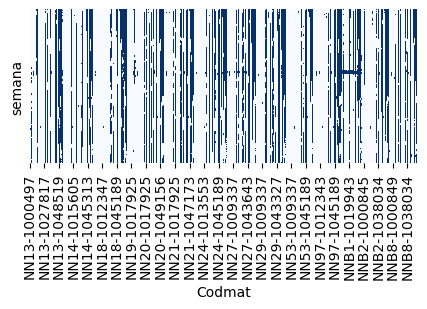

In [133]:
# identify missing data series (dark blue areas with missing data)
plt.subplots(figsize=(5, 2))
sns.heatmap(df_restructured.isnull(), yticklabels=False, cbar=False, cmap = "Blues")

In [134]:
null_codmateriales =pd.DataFrame(df_restructured.isnull().sum()).reset_index()
null_codmateriales = null_codmateriales[null_codmateriales[0] >0]
null_codmateriales["Porcentaje/Periodos"] = null_codmateriales[0]/len(df.semanacalendario.unique())*100
null_codmateriales = null_codmateriales.rename(columns={0:'cantidadPeriodosVacios'})
null_codmateriales= null_codmateriales.sort_values(by='Porcentaje/Periodos',ascending=False)
null_codmateriales

,Codmat,cantidadPeriodosVacios,Porcentaje/Periodos
338,NN24-1045189,154,99.354839
281,NN21-1045189,154,99.354839
494,NN53-1045189,154,99.354839
546,NN97-1045189,154,99.354839
453,NN29-1051543,154,99.354839
...,...,...,...
255,NN21-1012346,1,0.645161
188,NN20-1000031,1,0.645161
80,NN14-1019732,1,0.645161
459,NN53-1000031,1,0.645161


<Axes: >

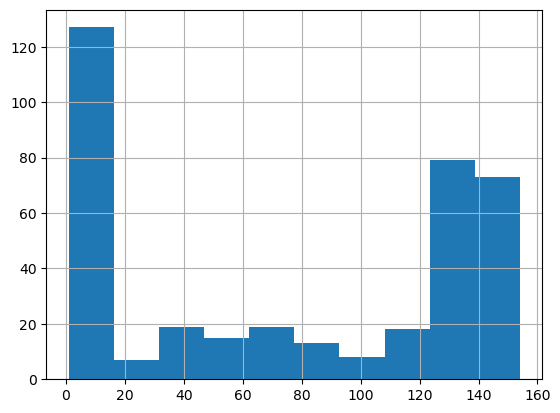

In [135]:
null_codmateriales.cantidadPeriodosVacios.hist()

In [136]:
print("Number of combinations that have at least one empty period: ", len(null_codmateriales.Codmat.unique()))
print("Percentage of combinations that have at least one empty period: ",\
                  len(null_codmateriales.Codmat.unique())/len(df.Codmat.unique())*100)
print("Number of combinations that have more than 30% of the empty periods: ",\
                  len(null_codmateriales[null_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique()))
print("Percentage of combinations that have more than 30% of empty periods: ",\
                  len(null_codmateriales[null_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique())/len(df.Codmat.unique())*100)

Number of combinations that have at least one empty period:  378
Percentage of combinations that have at least one empty period:  54.46685878962536
Number of combinations that have more than 30% of the empty periods:  225
Percentage of combinations that have more than 30% of empty periods:  32.42074927953891


In [137]:
null_codmateriales[null_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique()

array(['NN24-1045189', 'NN21-1045189', 'NN53-1045189', 'NN97-1045189',
       'NN29-1051543', 'NN14-1045189', 'NN29-1015294', 'NN13-1045189',
       'NNB2-1044346', 'NNB8-1045313', 'NN27-1045313', 'NN14-1032538',
       'NN20-1045313', 'NN53-1045313', 'NNB1-1045190', 'NNB2-1045313',
       'NNB2-1019561', 'NNB2-1055779', 'NN13-1045313', 'NN29-1045189',
       'NN13-1008595', 'NN18-1045189', 'NN14-1045313', 'NN24-1045313',
       'NNB8-1019561', 'NNB8-1045190', 'NN21-1034132', 'NN29-1045313',
       'NN21-1045313', 'NN14-1045190', 'NNB2-1045190', 'NN97-1045313',
       'NN20-1045190', 'NN18-1045313', 'NN97-1045190', 'NNB1-1038035',
       'NN53-1045190', 'NN27-1045190', 'NN13-1045190', 'NN14-1013553',
       'NN21-1045190', 'NNB2-1049156', 'NN24-1045190', 'NN29-1045190',
       'NN18-1045190', 'NNB8-1013553', 'NN24-1027839', 'NNB8-1049156',
       'NN13-1027880', 'NN21-1051544', 'NNB1-1055779', 'NN13-1061857',
       'NN20-1019561', 'NN18-1061857', 'NN24-1032957', 'NN53-1019561',
      

the combinations ['NN24-1045189', 'NN21-1045189', 'NN53-1045189', 'NN97-1045189',
       'NN29-1051543', 'NN14-1045189', 'NN29-1015294', 'NN13-1045189',
       'NNB2-1044346', 'NNB8-1045313', 'NN27-1045313', 'NN14-1032538',
       'NN20-1045313', 'NN53-1045313', 'NNB1-1045190', 'NNB2-1045313',
       'NNB2-1019561', 'NNB2-1055779', 'NN13-1045313', 'NN29-1045189',
       'NN13-1008595', 'NN18-1045189', 'NN14-1045313', 'NN24-1045313',
       'NNB8-1019561', 'NNB8-1045190', 'NN21-1034132', 'NN29-1045313',
       'NN21-1045313', 'NN14-1045190', 'NNB2-1045190', 'NN97-1045313',
       'NN20-1045190', 'NN18-1045313', 'NN97-1045190', 'NNB1-1038035',
       'NN53-1045190', 'NN27-1045190', 'NN13-1045190', 'NN14-1013553',
       'NN21-1045190', 'NNB2-1049156', 'NN24-1045190', 'NN29-1045190',
       'NN18-1045190', 'NNB8-1013553', 'NN24-1027839', 'NNB8-1049156',
       'NN13-1027880', 'NN21-1051544', 'NNB1-1055779', 'NN13-1061857',
       'NN20-1019561', 'NN18-1061857', 'NN24-1032957', 'NN53-1019561',
       'NN18-1050413', 'NN18-1050702', 'NN21-1032957', 'NN24-1027880',
       'NN24-1032538', 'NN53-1032538', 'NNB1-1019944', 'NN13-1027839',
       'NN14-1027880', 'NN20-1027880', 'NNB8-1034132', 'NN21-1055779',
       'NNB8-1055779', 'NNB8-1047909', 'NN24-1061857', 'NNB8-1032538',
       'NNB1-1055778', 'NN53-1034132', 'NN13-1032538', 'NN27-1013553',
       'NN18-1051544', 'NN53-1013553', 'NN97-1032538', 'NNB1-1049156',
       'NNB2-1034132', 'NN53-1055779', 'NN21-1019561', 'NN29-1055779',
       'NN27-1047173', 'NNB8-1044346', 'NN21-1032538', 'NN21-1051543',
       'NN20-1013553', 'NN20-1049156', 'NN27-1049156', 'NN14-1055779',
       'NN27-1055779', 'NN29-1061857', 'NN14-1041047', 'NN13-1055779',
       'NN97-1055779', 'NN18-1049156', 'NN24-1049156', 'NN20-1055779',
       'NN21-1049156', 'NN13-1049156', 'NN19-1013553', 'NN14-1049156',
       'NN29-1049156', 'NN53-1049156', 'NN29-1032538', 'NN97-1049156',
       'NN18-1055779', 'NN29-1027880', 'NN97-1034132', 'NNB8-1055778',
       'NN97-1013553', 'NNB8-1038034', 'NN20-1032538', 'NN97-1055778',
       'NN27-1051543', 'NNB2-1055778', 'NN24-1055779', 'NNB2-1000840',
       'NNB2-1047909', 'NNB2-1038034', 'NN53-1055778', 'NN27-1019561',
       'NN20-1038034', 'NN20-1055778', 'NN97-1038034', 'NN18-1055778',
       'NN27-1055778', 'NN53-1038034', 'NN29-1038034', 'NN21-1055778',
       'NN14-1055778', 'NN21-1038034', 'NN29-1055778', 'NN18-1012346',
       'NN18-1047909', 'NN27-1038034', 'NN13-1055778', 'NN29-1013553',
       'NN18-1038034', 'NN18-1051543', 'NN14-1038034', 'NN24-1038034',
       'NNB2-1013553', 'NN27-1032538', 'NN18-1044346', 'NNB1-1047173',
       'NN24-1055778', 'NN14-1047173', 'NN13-1038034', 'NN18-1019561',
       'NN29-1034132', 'NN24-1047173', 'NN13-1047173', 'NN97-1047173',
       'NNB8-1009337', 'NN20-1034132', 'NN14-1034132', 'NN13-1034132',
       'NNB2-1032538', 'NN13-1013553', 'NN24-1013553', 'NN20-1051544',
       'NN24-1019561', 'NN27-1034132', 'NN27-1051544', 'NNB1-1000849',
       'NN18-1034132', 'NN21-1013553', 'NN24-1051543', 'NN24-1034132',
       'NNB2-1044597', 'NN29-1047173', 'NN14-1000498', 'NN53-1053497',
       'NN20-1053497', 'NN18-1013553', 'NNB8-1053497', 'NN18-1053497',
       'NN21-1053497', 'NNB2-1053497', 'NN24-1053497', 'NN29-1053497',
       'NN27-1053497', 'NNB1-1053497', 'NN21-1035619', 'NN18-1032538',
       'NNB1-1000820', 'NN24-1041047', 'NNB2-1009337', 'NN20-1012346',
       'NNB2-1000849', 'NNB1-1047642', 'NN14-1054252', 'NNB8-1054251',
       'NN27-1054251', 'NNB2-1054251', 'NN13-1054252', 'NN29-1054251',
       'NN21-1054251', 'NN97-1054252', 'NN18-1054251', 'NN53-1054251',
       'NN20-1054251', 'NN24-1054251', 'NN13-1000814', 'NNB1-1041047',
       'NN27-1000849', 'NN97-1048519', 'NN19-1047642', 'NN13-1000911',
       'NNB8-1038035', 'NN20-1044597', 'NN97-1038035', 'NN53-1038035',
       'NN14-1048519', 'NN29-1047642', 'NNB2-1038035', 'NN14-1038035',
       'NN13-1048519', 'NN24-1038035', 'NN27-1038035', 'NN13-1038035',
       'NN20-1038035'] have more than 30% of the voids

The decision will be to remove these values from the original dataframe.

In [138]:
df_without_empty = df.copy()

In [139]:
df_without_empty= df_without_empty[~df_without_empty.Codmat.isin(list(null_codmateriales[null_codmateriales["Porcentaje/Periodos"]>30].Codmat.unique()))]
df_without_empty

,semana,Codmat,cant,semanacalendario,centro,material
0,2020-03-02,NN13-1000497,1891.000,2020.10,NN13,1000497
1,2020-03-02,NN13-1000498,544.333,2020.10,NN13,1000498
2,2020-03-02,NN13-1000794,4370.000,2020.10,NN13,1000794
4,2020-03-02,NN13-1000820,489.500,2020.10,NN13,1000820
5,2020-03-02,NN13-1000821,56.000,2020.10,NN13,1000821
...,...,...,...,...,...,...
78882,2023-02-13,NNB8-1042123,33.000,2023.07,NNB8,1042123
78883,2023-02-13,NNB8-1046292,1291.853,2023.07,NNB8,1046292
78884,2023-02-13,NNB8-1045787,420.600,2023.07,NNB8,1045787
78885,2023-02-13,NNB8-1047173,68.811,2023.07,NNB8,1047173


In [140]:
df_material_without_empty = df_without_empty.groupby(['material', 'semana'])['cant'].sum().reset_index()
df_material_without_empty

,material,semana,cant
0,1000031,2020-03-02,4553.695
1,1000031,2020-03-09,5492.006
2,1000031,2020-03-16,3870.255
3,1000031,2020-03-23,2284.952
4,1000031,2020-03-30,4020.223
...,...,...,...
8098,1047909,2023-01-16,340.536
8099,1047909,2023-01-23,256.292
8100,1047909,2023-01-30,216.120
8101,1047909,2023-02-06,255.791


In [141]:
# the table is restructured to measure the completeness of the series
df_material_out_empty_restructured=df_material_without_empty.pivot(index='semana',columns="material",values='cant')
df_material_out_empty_restructured

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
semana,,,,,,,,,,,,,,,,,,,,,
2020-03-02,4553.695,2347.000,544.333,5981.0,24.0,14851.851,7356.609,4503.815,3573.975,2498.545,...,249.335,22960.040,110.939,NaN,10148.760,8880.0,113025.608,NaN,NaN,NaN
2020-03-09,5492.006,1822.000,1095.333,5012.0,24.0,20132.220,8500.055,6022.121,4475.146,3671.445,...,196.332,25470.400,142.875,NaN,8735.300,5064.0,121110.343,NaN,NaN,NaN
2020-03-16,3870.255,3676.000,305.000,6980.0,54.0,17560.170,10662.832,2794.617,3850.982,2205.495,...,152.667,29341.360,61.605,NaN,6737.240,4227.0,136362.053,251.148,NaN,NaN
2020-03-23,2284.952,3771.000,220.334,8112.0,55.0,12551.380,7451.010,962.701,4442.017,934.211,...,106.336,29283.440,39.896,NaN,3649.804,6486.0,126563.382,60.121,NaN,NaN
2020-03-30,4020.223,3540.000,347.333,7770.0,40.0,14913.400,10086.938,1370.585,5302.665,1392.940,...,122.336,29132.040,54.938,NaN,6386.272,5639.0,129238.568,103.010,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-16,5917.500,2829.625,1180.000,1768.0,56.0,19041.167,13598.722,5955.619,5770.000,5272.000,...,217.333,62679.652,190.000,119587.0,23782.500,12382.0,165999.862,2275.922,1326.000,340.536
2023-01-23,5024.438,2208.000,319.667,1362.0,40.0,16284.000,12549.986,4863.438,4954.501,3553.500,...,203.334,58798.000,86.875,143479.0,15363.100,8245.0,150738.864,990.373,944.859,256.292
2023-01-30,4574.348,3158.000,484.333,1944.0,40.0,17300.000,13760.514,4977.264,4293.500,2932.500,...,244.334,72342.000,127.875,124350.0,19986.400,10641.0,158124.138,1281.604,1070.000,216.120


Repeat normalization and search for atypicals

In [142]:
df_material_out_normalize = (df_material_out_empty_restructured - df_material_out_empty_restructured.min())/(df_material_out_empty_restructured.max() - df_material_out_empty_restructured.min())

In [143]:
names =df_material_out_normalize.columns
IQR = iqr(df_material_out_normalize, axis = 0, rng = (25, 75), interpolation = 'midpoint')
DC = IQR/2

Q1 = np.percentile(df_material_out_normalize, 25, axis = 0, interpolation = 'midpoint')
Q3 = np.percentile(df_material_out_normalize, 75, axis = 0, interpolation = 'midpoint')

Min_Limite2 = Q1 - 1.5*IQR
Max_Limite2 = Q3 + 1.5*IQR

outliers = [[] for _ in range(df_material_out_normalize.shape[1])]
post_outliers = [[] for _ in range(df_material_out_normalize.shape[1])]

for i in range(df_material_out_normalize.shape[1]):
    for j in range(df_material_out_normalize.shape[0]):
        if df_material_out_normalize.iloc[j, i] < Min_Limite2[i] or df_material_out_normalize.iloc[j, i] > Max_Limite2[i]:
            outliers[i].append(df_material_out_normalize.iloc[j, i])
            post_outliers[i].append(j)

Number_outliers = [len(outliers[i]) for i in range(len(outliers))]
report = pd.DataFrame(Number_outliers, index=names, columns=['Number Outliers'])

data_tamponade_out = df_material_out_normalize.copy()

cols = names
for i,col in enumerate(cols):
    data_tamponade_out[col] = np.where(data_tamponade_out[col] > Max_Limite2[i], Max_Limite2[i],
                                np.where(data_tamponade_out[col] < Min_Limite2[i], Min_Limite2[i], data_tamponade_out[col]))
								
# Create the box plot
fig = px.box(data_tamponade_out)

# Update the layout
fig.update_layout(title='Tamponade data',xaxis_title='Material',yaxis_title='UMB',height=450)

# Display the plot
fig.show()

In [145]:
H_1 = entr(df_material_out_normalize)
H_2 = entr(data_tamponade_out)

entropy_normalize_1 = H_1.sum()/df_material_out_normalize.shape[0]
entropy_normalize_2 = H_2.sum()/data_tamponade_out.shape[0]

entropy_normalize_1 = pd.DataFrame(entropy_normalize_2, index = None, columns = ['Original Entrpy'])
entropy_normalize_2 = pd.DataFrame(entropy_normalize_2, index = None, columns = ['Entropy IQR tamponade'])
Comparison_entropy = pd.concat([entropy_normalize_1, entropy_normalize_2], axis = 1)

display(Comparison_entropy)

,Original Entrpy,Entropy IQR tamponade
material,,
1000031,0.278287,0.278287
1000497,0.306548,0.306548
1000498,0.314151,0.314151
1000794,0.285053,0.285053
1000812,0.337481,0.337481
1000814,0.198335,0.198335
1000820,0.323300,0.323300
1000821,0.284068,0.284068
1000833,0.316488,0.316488


In [146]:
df_material_without_emp = data_tamponade_out.copy()
df_material_without_empty

<Axes: xlabel='material', ylabel='semana'>

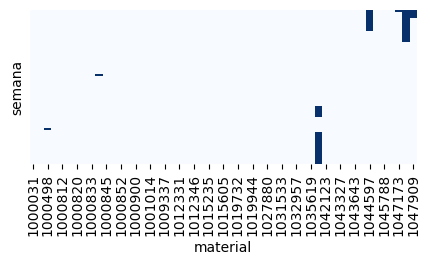

In [147]:
# identify missing data series (dark blue areas with missing data)
plt.subplots(figsize=(5, 2))
sns.heatmap(df_material_without_emp.isnull(), yticklabels=False, cbar=False, cmap = "Blues")

In [148]:
null_materials =pd.DataFrame(df_material_out_empty_restructured.isnull().sum()).reset_index()
null_materials = null_materials[null_materials[0] >0]
null_materials["Porcentaje/Periodos"] = null_materials[0]/len(df.semanacalendario.unique())*100
null_materials = null_materials.rename(columns={0:'cantidadPeriodosVacios'})
null_materials= null_materials.sort_values(by='Porcentaje/Periodos',ascending=False)
null_materials

,material,cantidadPeriodosVacios,Porcentaje/Periodos
39,1038035,43,27.741935
51,1047642,33,21.290323
46,1044597,22,14.193548
52,1047909,8,5.161290
2,1000498,2,1.290323
9,1000840,2,1.290323
50,1047173,2,1.290323


Data with missing information will be imputed

In [151]:
df_material_out_empty_restructured[null_materials.material.unique()]

material,1038035,1047642,1044597,1047909,1000498,1000840,1047173
semana,,,,,,,
2020-03-02,1132.0,NaN,NaN,NaN,544.333,2498.545,NaN
2020-03-09,1180.0,NaN,NaN,NaN,1095.333,3671.445,NaN
2020-03-16,2802.0,NaN,NaN,NaN,305.000,2205.495,251.148
2020-03-23,1593.0,NaN,NaN,NaN,220.334,934.211,60.121
2020-03-30,2543.0,NaN,NaN,NaN,347.333,1392.940,103.010
...,...,...,...,...,...,...,...
2023-01-16,NaN,1326.000,119587.0,340.536,1180.000,5272.000,2275.922
2023-01-23,NaN,944.859,143479.0,256.292,319.667,3553.500,990.373
2023-01-30,NaN,1070.000,124350.0,216.120,484.333,2932.500,1281.604


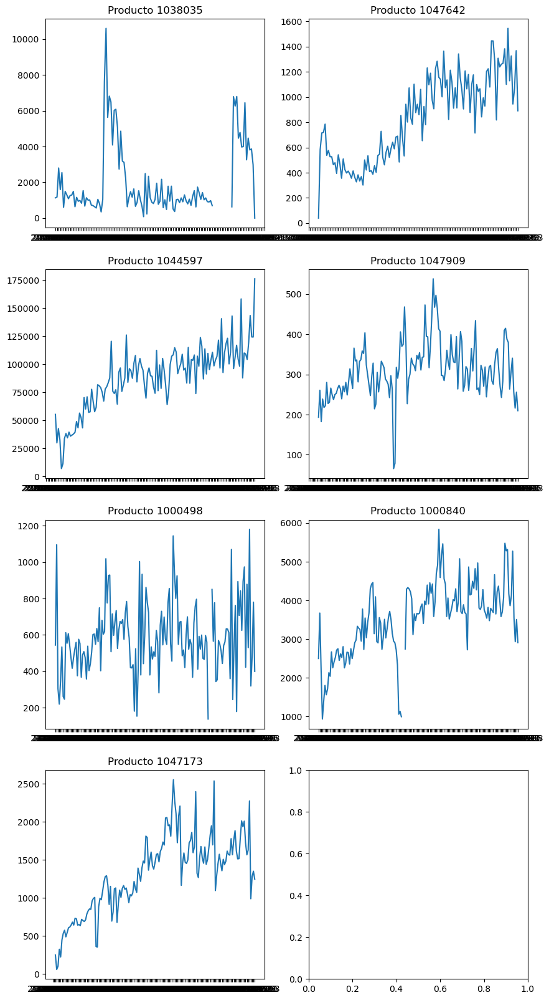

In [152]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 20)) 
axs = axs.flatten()  

for i, col in enumerate(df_material_out_empty_restructured[null_materials.material.unique()].columns):
    axs[i].plot(df_material_out_empty_restructured[null_materials.material.unique()][col])
    axs[i].set_title(f"Producto {col}")

    

The data of the series of materials will be imputed, with less than 30% missing

### Imputation with linear regression

In [153]:
df_material_out_empty =pd.DataFrame(df_material_out_empty_restructured[null_materials.material.unique()]['1038035']).reset_index()
df_material_out_empty 

,semana,1038035
0,2020-03-02,1132.0
1,2020-03-09,1180.0
2,2020-03-16,2802.0
3,2020-03-23,1593.0
4,2020-03-30,2543.0
...,...,...
150,2023-01-16,NaN
151,2023-01-23,NaN
152,2023-01-30,NaN
153,2023-02-06,NaN


In [154]:
# Create a training dataset and a test dataset
df_train = df_material_out_empty.dropna()
df_test = df_material_out_empty[df_material_out_empty.isnull().any(axis=1)]
df_train['fecha_num'] = pd.to_datetime(df_train['semana']).apply(lambda x: x.toordinal())
df_test['fecha_num'] = pd.to_datetime(df_test['semana']).apply(lambda x: x.toordinal())

In [155]:
# Create linear regression model
model = LinearRegression()

# Fit the model to the training data
model.fit(df_train[['fecha_num']], df_train['1038035'])

LinearRegression()

In [156]:
# Make predictions on the test set
df_test['1038035'] = model.predict(df_test[['fecha_num']])

In [157]:
# Combine the training set and the test set
df_filled = pd.concat([df_train, df_test], axis=0)
df_filled = df_filled.sort_values(by='semana').reset_index(drop=True)

print(df_filled)

         semana      1038035  fecha_num
0    2020-03-02  1132.000000     737486
1    2020-03-09  1180.000000     737493
2    2020-03-16  2802.000000     737500
3    2020-03-23  1593.000000     737507
4    2020-03-30  2543.000000     737514
..          ...          ...        ...
150  2023-01-16  2849.007031     738536
151  2023-01-23  2857.714199     738543
152  2023-01-30  2866.421367     738550
153  2023-02-06  2875.128534     738557
154  2023-02-13  2883.835702     738564

[155 rows x 3 columns]


<Axes: >

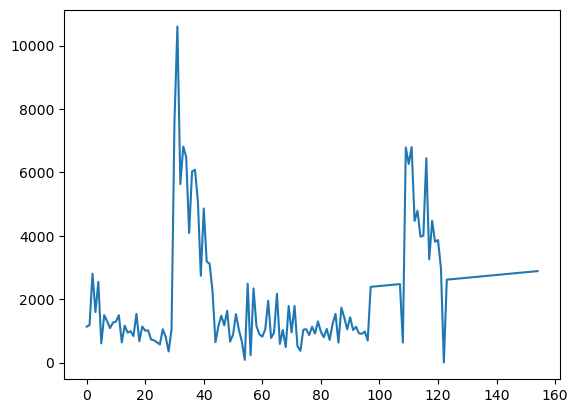

In [158]:
df_filled['1038035'].plot()

### Imputation with KNN

In [162]:
df_material_out_empty['fechaCorregida']= pd.to_datetime(df_material_out_empty['semana']).apply(lambda x: x.toordinal())

In [163]:
df_material_out_emp=df_material_out_empty[['fechaCorregida','1038035']]

In [164]:
imp_5 = KNNImputer(missing_values = np.nan, n_neighbors = 5, weights= "distance") # Euclidean distance
# Imputation by the KNN algorithm with 5 neighbors and weighted average where
# the closest neighbors of a value will have a greater influence than the neighbors that are further away.
imp_5.fit(df_material_out_emp)
imputation_data_KNN = imp_5.transform(df_material_out_emp)

In [165]:
imputation_data_KNN=pd.DataFrame(imputation_data_KNN, columns = ['fechaCorregida','1038035'])
imputation_data_KNN

,fechaCorregida,1038035
0,737486.0,1132.000000
1,737493.0,1180.000000
2,737500.0,2802.000000
3,737507.0,1593.000000
4,737514.0,2543.000000
...,...,...
150,738536.0,2959.310907
151,738543.0,2961.502501
152,738550.0,2963.554043
153,738557.0,2965.478558


<Axes: >

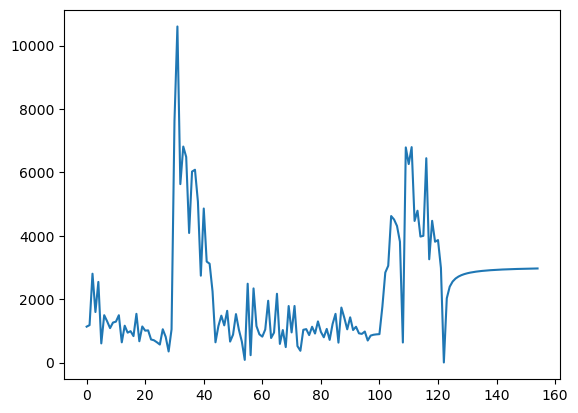

In [166]:
imputation_data_KNN['1038035'].plot()

After carrying out a first imputation by linear regression and by KNN, it is decided to carry out imputation by KNN for the other series.

It is an imputation method based on the nearest neighbor algorithm or KNN. This method fills in the missing values by calculating the Euclidean distance of the nearest neighbors, and for each feature, the missing values are imputed by a uniform average. However, if each feature has more than one missing value, the neighbors for that sample may be different depending on the feature being imputed. It is important to note that if the number of neighbors defined by the user is less than the number of neighbors that can be determined in the data, and also if there are no Euclidean distances that can be calculated, the imputation is done by averaging the existing values (as in mean imputation). If there is at least one neighbor with a calculated distance, a weighted or unweighted average is applied to the remaining neighbors.

In [169]:
df_material_out_empty_restructured[null_materials.material.unique()]

material,1038035,1047642,1044597,1047909,1000498,1000840,1047173
semana,,,,,,,
2020-03-02,1132.0,NaN,NaN,NaN,544.333,2498.545,NaN
2020-03-09,1180.0,NaN,NaN,NaN,1095.333,3671.445,NaN
2020-03-16,2802.0,NaN,NaN,NaN,305.000,2205.495,251.148
2020-03-23,1593.0,NaN,NaN,NaN,220.334,934.211,60.121
2020-03-30,2543.0,NaN,NaN,NaN,347.333,1392.940,103.010
...,...,...,...,...,...,...,...
2023-01-16,NaN,1326.000,119587.0,340.536,1180.000,5272.000,2275.922
2023-01-23,NaN,944.859,143479.0,256.292,319.667,3553.500,990.373
2023-01-30,NaN,1070.000,124350.0,216.120,484.333,2932.500,1281.604


In [170]:
imp_5 = KNNImputer(missing_values = np.nan, n_neighbors = 5, weights= "distance") # Euclidean distance
# Imputation by the KNN algorithm with 5 neighbors and weighted average where
# the closest neighbors of a value will have a greater influence than the neighbors that are further away.
imp_5.fit(df_material_out_empty_restructured[null_materials.material.unique()])
imputation_data_KNN = imp_5.transform(df_material_out_empty_restructured[null_materials.material.unique()])

In [171]:
imputation_data_KNN = pd.DataFrame(imputation_data_KNN, columns = null_materials.material.unique())

In [172]:
imputation_data_KNN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   1038035  155 non-null    float64
 1   1047642  155 non-null    float64
 2   1044597  155 non-null    float64
 3   1047909  155 non-null    float64
 4   1000498  155 non-null    float64
 5   1000840  155 non-null    float64
 6   1047173  155 non-null    float64
dtypes: float64(7)
memory usage: 8.6 KB


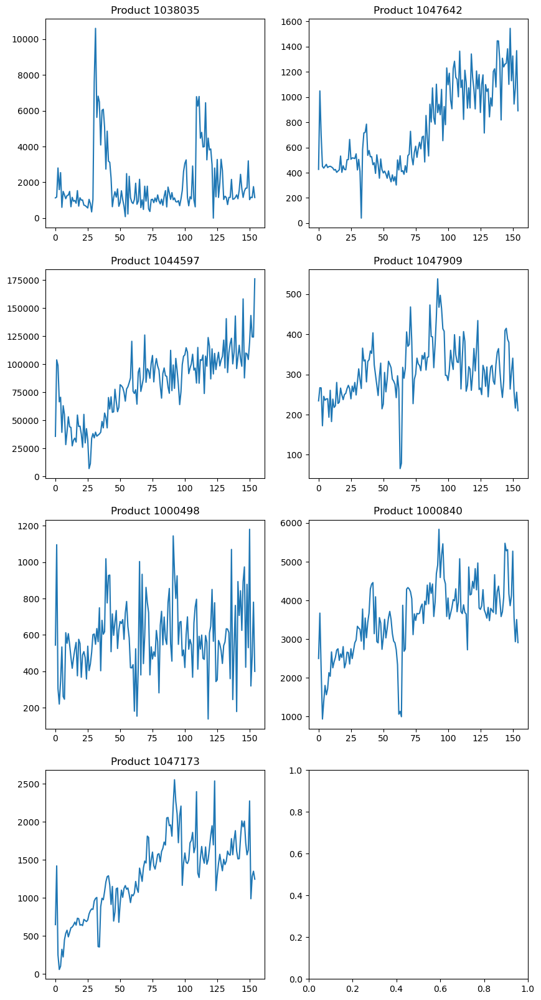

In [173]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 20)) 
axs = axs.flatten() 

for i, col in enumerate(imputation_data_KNN.columns):
    axs[i].plot(imputation_data_KNN[col])
    axs[i].set_title(f"Product {col}")

The values will be entered into the dataset without the missing information

In [174]:
imp_5 = KNNImputer(missing_values = np.nan, n_neighbors = 5, weights= "distance") # Euclidean distance
# Imputation by the KNN algorithm with 5 neighbors and weighted average where
# the closest neighbors of a value will have a greater influence than the neighbors that are further away.
imp_5.fit(df_material_out_empty_restructured)
imputation_data_KNN = imp_5.transform(df_material_out_empty_restructured)

In [175]:
df_material_out_empty_restructured.columns

Index(['1000031', '1000497', '1000498', '1000794', '1000812', '1000814',
       '1000820', '1000821', '1000833', '1000840', '1000845', '1000849',
       '1000852', '1000853', '1000900', '1000911', '1001014', '1001311',
       '1009337', '1012329', '1012331', '1012343', '1012346', '1012347',
       '1015235', '1015294', '1015605', '1017925', '1019732', '1019943',
       '1019944', '1027817', '1027880', '1029973', '1031533', '1031534',
       '1032957', '1035365', '1035619', '1038035', '1042123', '1042513',
       '1043327', '1043443', '1043643', '1044284', '1044597', '1045787',
       '1045788', '1046292', '1047173', '1047642', '1047909'],
      dtype='object', name='material')

In [176]:
imputation_data_KNN = pd.DataFrame(imputation_data_KNN, columns = df_material_out_empty_restructured.columns)

In [177]:
imputation_data_KNN.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155 entries, 0 to 154
Data columns (total 53 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   1000031  155 non-null    float64
 1   1000497  155 non-null    float64
 2   1000498  155 non-null    float64
 3   1000794  155 non-null    float64
 4   1000812  155 non-null    float64
 5   1000814  155 non-null    float64
 6   1000820  155 non-null    float64
 7   1000821  155 non-null    float64
 8   1000833  155 non-null    float64
 9   1000840  155 non-null    float64
 10  1000845  155 non-null    float64
 11  1000849  155 non-null    float64
 12  1000852  155 non-null    float64
 13  1000853  155 non-null    float64
 14  1000900  155 non-null    float64
 15  1000911  155 non-null    float64
 16  1001014  155 non-null    float64
 17  1001311  155 non-null    float64
 18  1009337  155 non-null    float64
 19  1012329  155 non-null    float64
 20  1012331  155 non-null    float64
 21  1012343  155 non

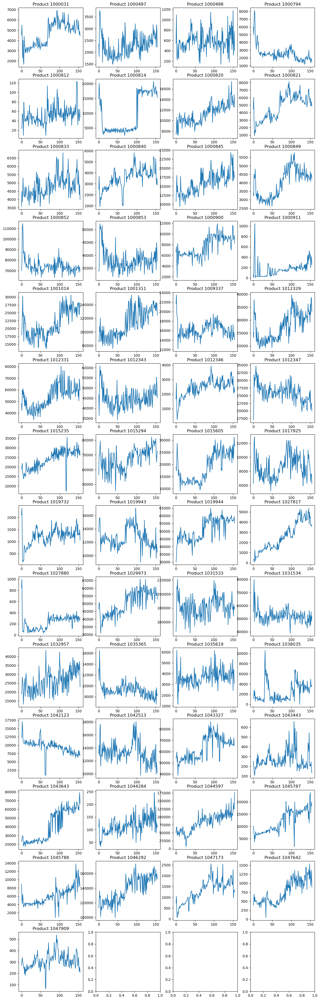

In [178]:
fig, axs = plt.subplots(nrows=14, ncols=4, figsize=(15, 50))
axs = axs.flatten()

for i, col in enumerate(imputation_data_KNN.columns):
    axs[i].plot(imputation_data_KNN[col])
    axs[i].set_title(f"Product {col}")

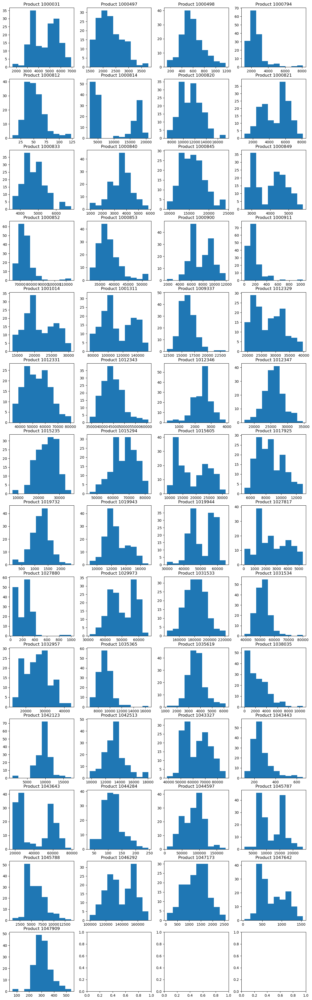

In [179]:
fig, axs = plt.subplots(nrows=14, ncols=4, figsize=(15, 50))
axs = axs.flatten() 

for i, col in enumerate(imputation_data_KNN.columns):
    axs[i].hist(imputation_data_KNN[col])
    axs[i].set_title(f"Product {col}")

In [180]:
Selected_Products = imputation_data_KNN.copy()

## Data understanding

In [181]:
Selected_Products

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,4553.695,2347.000,544.333,5981.0,24.0,14851.851,7356.609,4503.815,3573.975,2498.545,...,249.335,22960.040,110.939,50176.700754,10148.760,8880.0,113025.608,732.990088,385.406163,269.992169
1,5492.006,1822.000,1095.333,5012.0,24.0,20132.220,8500.055,6022.121,4475.146,3671.445,...,196.332,25470.400,142.875,67663.379795,8735.300,5064.0,121110.343,1053.363983,471.146709,307.053783
2,3870.255,3676.000,305.000,6980.0,54.0,17560.170,10662.832,2794.617,3850.982,2205.495,...,152.667,29341.360,61.605,68121.540213,6737.240,4227.0,136362.053,251.148000,695.461646,339.363365
3,2284.952,3771.000,220.334,8112.0,55.0,12551.380,7451.010,962.701,4442.017,934.211,...,106.336,29283.440,39.896,42056.192999,3649.804,6486.0,126563.382,60.121000,486.295974,299.179125
4,4020.223,3540.000,347.333,7770.0,40.0,14913.400,10086.938,1370.585,5302.665,1392.940,...,122.336,29132.040,54.938,42498.666564,6386.272,5639.0,129238.568,103.010000,620.067963,293.661153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,5917.500,2829.625,1180.000,1768.0,56.0,19041.167,13598.722,5955.619,5770.000,5272.000,...,217.333,62679.652,190.000,119587.000000,23782.500,12382.0,165999.862,2275.922000,1326.000000,340.536000
151,5024.438,2208.000,319.667,1362.0,40.0,16284.000,12549.986,4863.438,4954.501,3553.500,...,203.334,58798.000,86.875,143479.000000,15363.100,8245.0,150738.864,990.373000,944.859000,256.292000
152,4574.348,3158.000,484.333,1944.0,40.0,17300.000,13760.514,4977.264,4293.500,2932.500,...,244.334,72342.000,127.875,124350.000000,19986.400,10641.0,158124.138,1281.604000,1070.000000,216.120000
153,4894.297,2957.000,780.001,1817.0,65.0,17495.556,14919.447,5479.046,4888.500,3505.500,...,155.001,79143.000,106.937,124272.000000,18814.900,9173.0,159626.702,1352.169000,1368.092000,255.791000


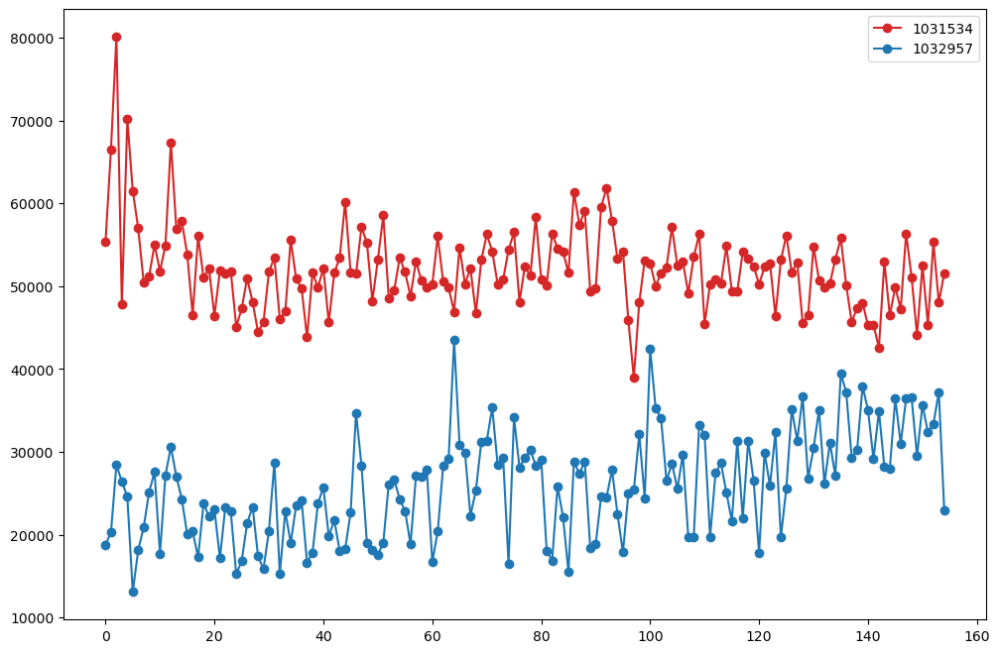

In [182]:
x = Selected_Products['1031534']
y = Selected_Products['1032957']

plt.figure(figsize=(12, 8))
plt.plot(x, "-o", c="C3")
plt.plot(y, "-o", c="C0")
plt.legend([x.name, y.name]);

In [183]:
Selected_Products_Moving_Mean = pd.DataFrame()

for columna in Selected_Products.columns:
    Selected_Products_Moving_Mean[columna] = Selected_Products[columna].rolling(window=2).mean()
Selected_Products_Moving_Mean = Selected_Products_Moving_Mean.dropna().reset_index(drop=True)
Selected_Products_Moving_Mean

,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,5022.8505,2084.5000,819.8330,5496.5,24.0,17492.0355,7928.3320,5262.9680,4024.5605,3084.9950,...,222.8335,24215.2200,126.9070,58920.040275,9442.030,6972.0,117067.9755,893.177036,428.276436,288.522976
1,4681.1305,2749.0000,700.1665,5996.0,39.0,18846.1950,9581.4435,4408.3690,4163.0640,2938.4700,...,174.4995,27405.8800,102.2400,67892.460004,7736.270,4645.5,128736.1980,652.255992,583.304177,323.208574
2,3077.6035,3723.5000,262.6670,7546.0,54.5,15055.7750,9056.9210,1878.6590,4146.4995,1569.8530,...,129.5015,29312.4000,50.7505,55088.866606,5193.522,5356.5,131462.7175,155.634500,590.878810,319.271245
3,3152.5875,3655.5000,283.8335,7941.0,47.5,13732.3900,8768.9740,1166.6430,4872.3410,1163.5755,...,114.3360,29207.7400,47.4170,42277.429781,5018.038,6062.5,127900.9750,81.565500,553.181968,296.420139
4,3032.2150,3307.5000,440.6665,6352.0,24.5,14184.8555,8635.1090,1534.8930,4869.1575,1597.5975,...,159.8360,23594.0400,44.4690,49380.344227,5674.662,4501.0,115058.4720,214.167500,559.014463,275.305780
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,5457.8750,2691.3125,855.0000,1940.5,60.0,18802.0835,13547.8435,5643.5115,5333.0000,4698.7890,...,208.1670,61136.3635,160.5000,111917.500000,23139.800,11556.5,161213.4160,1953.074000,1227.759500,323.266500
150,5470.9690,2518.8125,749.8335,1565.0,48.0,17662.5835,13074.3540,5409.5285,5362.2505,4412.7500,...,210.3335,60738.8260,138.4375,131533.000000,19572.800,10313.5,158369.3630,1633.147500,1135.429500,298.414000
151,4799.3930,2683.0000,402.0000,1653.0,40.0,16792.0000,13155.2500,4920.3510,4624.0005,3243.0000,...,223.8340,65570.0000,107.3750,133914.500000,17674.750,9443.0,154431.5010,1135.988500,1007.429500,236.206000
152,4734.3225,3057.5000,632.1670,1880.5,52.5,17397.7780,14339.9805,5228.1550,4591.0000,3219.0000,...,199.6675,75742.5000,117.4060,124311.000000,19400.650,9907.0,158875.4200,1316.886500,1219.046000,235.955500


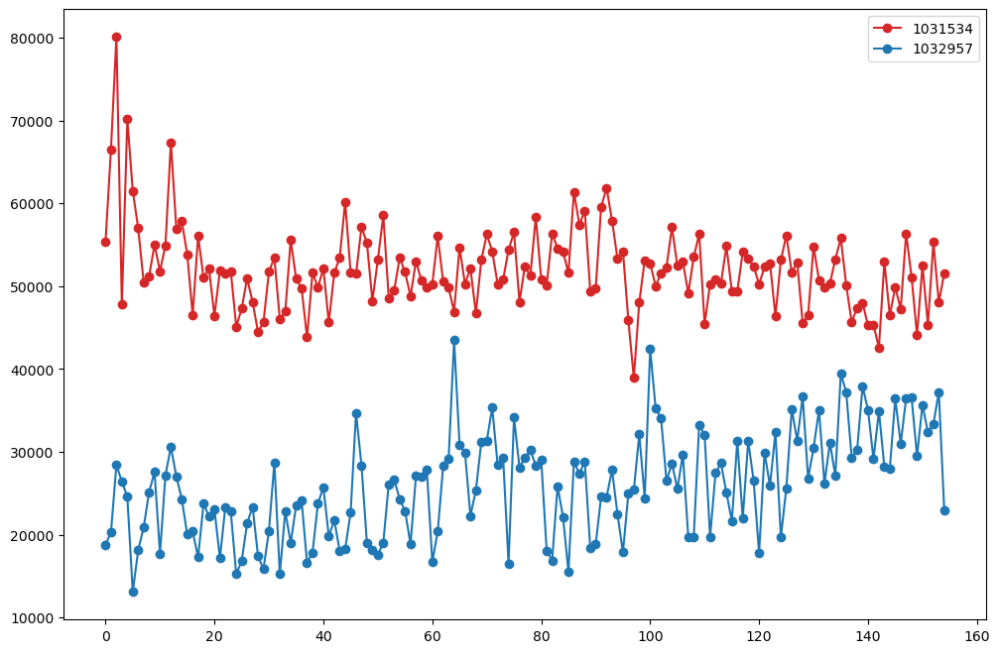

In [184]:
w = Selected_Products_Moving_Mean['1031534']
z = Selected_Products_Moving_Mean['1032957']

plt.figure(figsize=(12, 8))
plt.plot(x, "-o", c="C3")
plt.plot(y, "-o", c="C0")
plt.legend([x.name, y.name]);

## Preprocessing

We proceed to normalize the Selected Products dataset, with the following methodologies:
1. Z-Score Normalization <br>
2. MinMax Normalization <br>

In [185]:
ss = StandardScaler()
scaled_ss = ss.fit_transform(Selected_Products_Moving_Mean)
df_ss = pd.DataFrame(scaled_ss, columns=Selected_Products_Moving_Mean.columns, index=Selected_Products_Moving_Mean.index)
X_ss = df_ss.values
df_ss.head()

,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,0.379637,-0.490156,1.623346,3.008351,-1.810216,1.281932,-1.981634,0.335837,-1.445048,-0.497196,...,-0.563363,-0.955579,0.377116,-0.885924,-0.593966,0.523234,-1.343519,-0.843307,-1.036445,-0.339275
1,0.072843,1.208671,0.787494,3.517314,-0.848465,1.495910,-1.013878,-0.205469,-1.184847,-0.664868,...,-1.167710,-0.772070,-0.473131,-0.554363,-0.989206,-0.679810,-0.610470,-1.337401,-0.545882,0.220155
2,-1.366793,3.700028,-2.268374,5.096678,0.145345,0.896965,-1.320941,-1.807796,-1.215966,-2.231014,...,-1.730345,-0.662418,-2.247925,-1.027498,-1.578385,-0.312149,-0.439178,-2.355900,-0.521913,0.156652
3,-1.299473,3.526183,-2.120529,5.499161,-0.303472,0.687850,-1.489510,-2.258789,0.147642,-2.695929,...,-1.919967,-0.668438,-2.362827,-1.500923,-1.619046,0.052927,-0.662942,-2.507804,-0.641199,-0.211905
4,-1.407543,2.636504,-1.025075,3.880058,-1.778157,0.759347,-1.567876,-2.025538,0.141661,-2.199265,...,-1.351056,-0.991306,-2.464442,-1.238447,-1.466900,-0.754532,-1.469765,-2.235857,-0.622743,-0.552450


In [186]:
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(Selected_Products_Moving_Mean)
df_mm = pd.DataFrame(scaled_mm, columns=Selected_Products_Moving_Mean.columns, index=Selected_Products_Moving_Mean.index)
X_mm = df_mm.values
df_mm.head()

,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,0.628443,0.259275,0.716458,0.635068,0.079070,0.860810,0.059878,0.624239,0.106995,0.468392,...,0.222407,0.104126,0.458129,0.352866,0.244126,0.469344,0.158642,0.348134,0.119318,0.502553
1,0.560709,0.559587,0.564758,0.709636,0.218605,0.940274,0.247837,0.494007,0.157213,0.434437,...,0.123328,0.159600,0.321824,0.416457,0.149998,0.228452,0.352580,0.244793,0.253536,0.583121
2,0.242865,1.000000,0.010142,0.941032,0.362791,0.717847,0.188199,0.108504,0.151207,0.117276,...,0.031087,0.192748,0.037302,0.325713,0.009684,0.302071,0.397897,0.031771,0.260094,0.573975
3,0.257728,0.969268,0.036974,1.000000,0.297674,0.640189,0.155459,0.000000,0.414381,0.023127,...,0.000000,0.190928,0.018882,0.234914,0.000000,0.375172,0.338698,0.000000,0.227457,0.520897
4,0.233868,0.811994,0.235791,0.762783,0.083721,0.666740,0.140239,0.056118,0.413226,0.123706,...,0.093270,0.093326,0.002592,0.285255,0.036234,0.213490,0.125242,0.056878,0.232507,0.471852


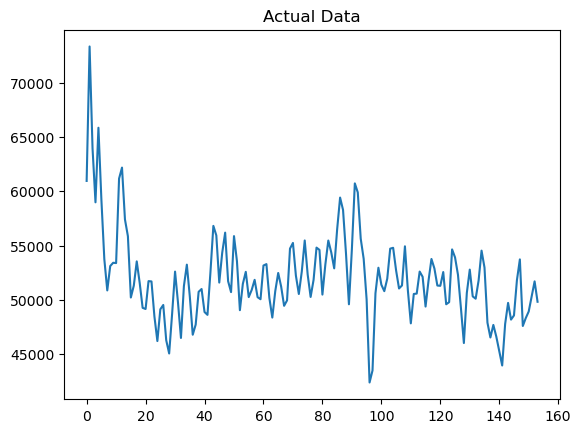

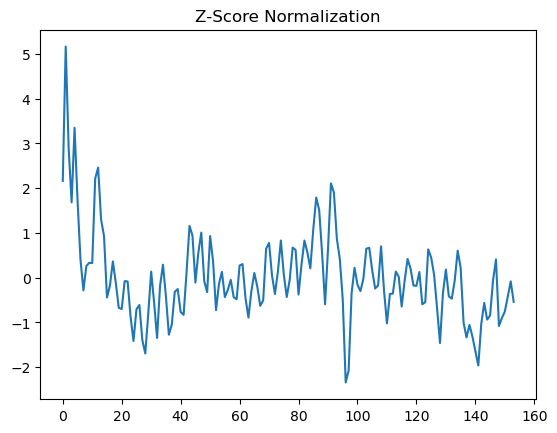

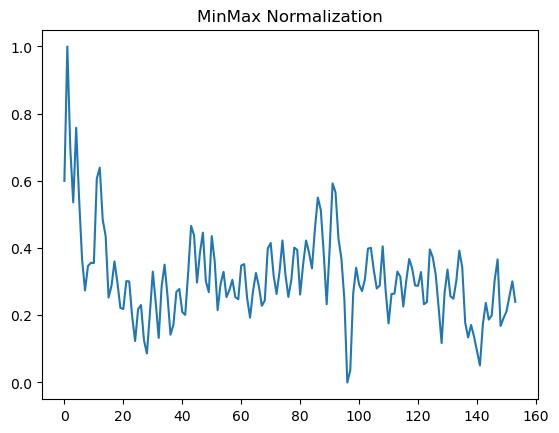

In [187]:
# Select a product Id to compare normal data with scaled data
product = "1031534"

# Visualize the sales (qty) for the product
Selected_Products_Moving_Mean[product].plot(title="Actual Data"), plt.show()
df_ss[product].plot(title="Z-Score Normalization"), plt.show()
df_mm[product].plot(title="MinMax Normalization"), plt.show();

It is decided to work with the MinMax normalization.

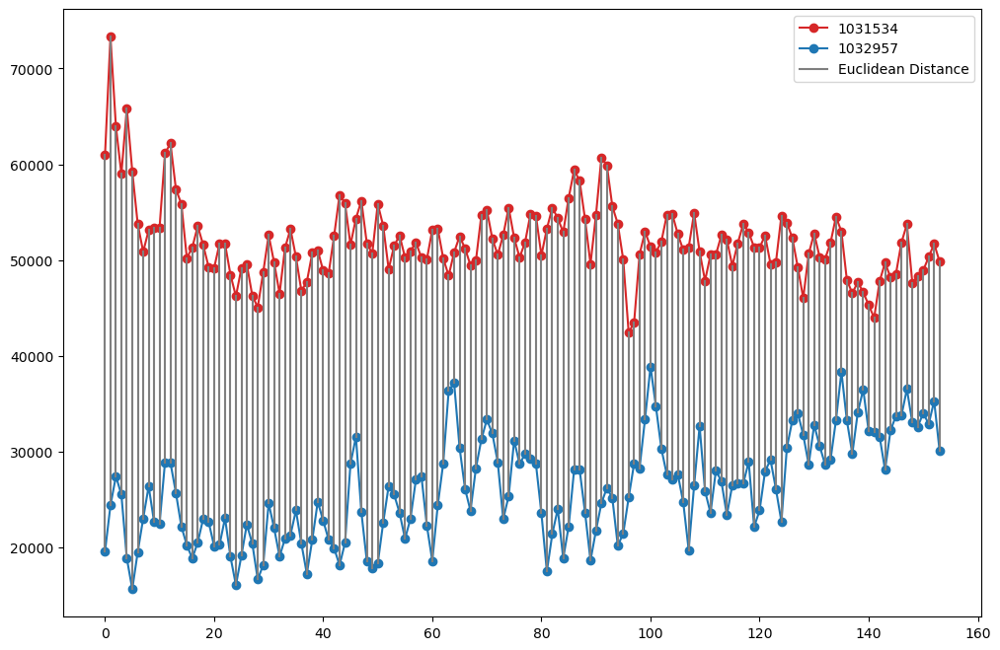

In [188]:
# Graphic representation of Euclidean Distance -One to One Match
plt.figure(figsize=(12, 8))
plt.plot(np.arange(w.shape[0]), w, "-o", c="C3")
plt.plot(np.arange(z.shape[0]), z, "-o", c="C0")
for i, (x_i, y_j) in enumerate(zip(w,  z)):
    plt.plot([i, i], [x_i, y_j], c="C7")
plt.legend([w.name, z.name, "Euclidean Distance"]);

In [189]:
# Distance matrix
N = w.shape[0]
M = z.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])
        # print (dist_mat[i, j])

Alignment cost: 3861136.1900
Normalized alignment cost: 12536.1565


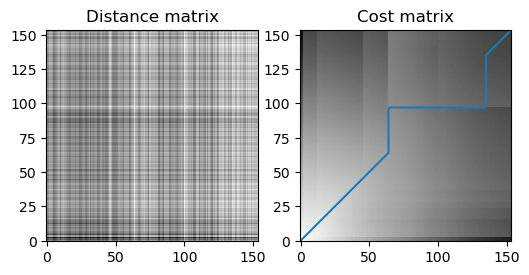

In [190]:
# DTW
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))

plt.figure(figsize=(6, 4))
plt.subplot(121)
plt.title("Distance matrix")
plt.imshow(dist_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
plt.subplot(122)
plt.title("Cost matrix")
plt.imshow(cost_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
x_path, y_path = zip(*path)
plt.plot(y_path, x_path);

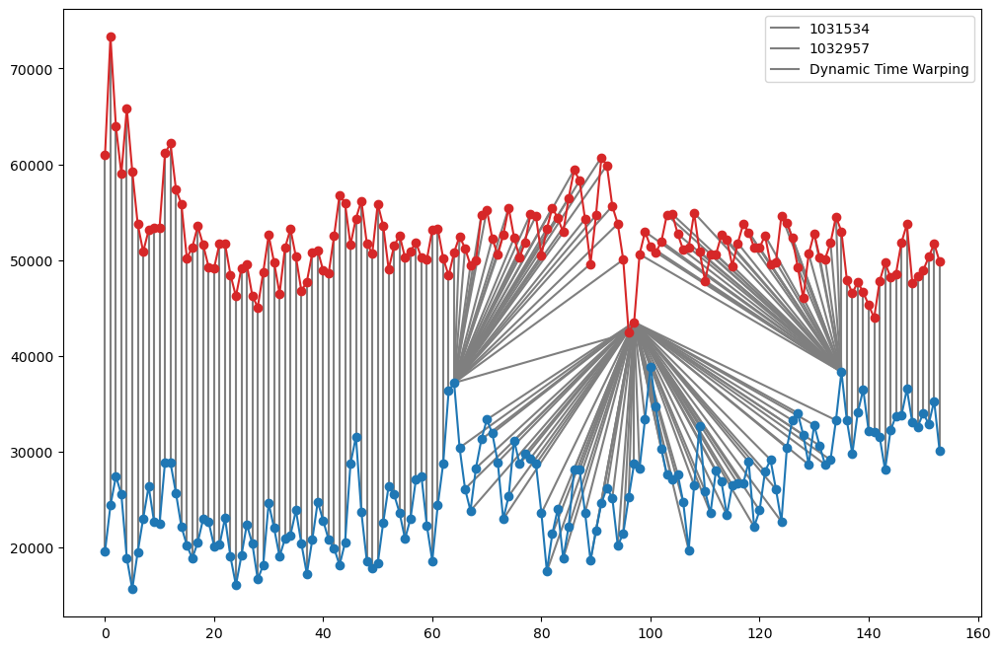

In [191]:
plt.figure(figsize=(12, 8))
for x_i, y_j in path:
    plt.plot([x_i, y_j], [w[x_i], z[y_j]], c="C7")
plt.plot(np.arange(w.shape[0]), w, "-o", c="C3")
plt.plot(np.arange(z.shape[0]), z, "-o", c="C0")
plt.legend([w.name, z.name, "Dynamic Time Warping"]);

## Tslearn will be used to compute K-Means with DTW, Soft-DTW and ED with their silhouette scores.

We will run the algorithm in parallel with the two different scaled data sets.
The idea is to group them under different parameters to find the combination with the best performance.

The data frame must be transposed, defining each moving week as a column and each subject as a row

In [192]:
X_mm = df_mm.T.values
df_mm.T.head()

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
1000031,0.628443,0.560709,0.242865,0.257728,0.233868,0.000000,0.233529,0.418571,0.315786,0.239706,...,0.766580,0.819082,0.771981,0.687947,0.644315,0.714672,0.717267,0.584150,0.571252,0.558561
1000497,0.259275,0.559587,1.000000,0.969268,0.811994,0.663985,0.623593,0.553994,0.581400,0.354147,...,0.566818,0.593482,0.572241,0.501513,0.489989,0.533516,0.455557,0.529759,0.699010,0.489537
1000498,0.716458,0.564758,0.010142,0.036974,0.235791,0.181914,0.000000,0.221847,0.416649,0.413268,...,0.639341,0.860131,0.562011,0.501585,0.569618,0.761039,0.627720,0.186773,0.478555,0.425101
1000794,0.635068,0.709636,0.941032,1.000000,0.762783,0.495857,0.404792,0.321863,0.358886,0.492722,...,0.133239,0.199597,0.198552,0.108159,0.105098,0.104202,0.048145,0.061282,0.095245,0.061133
1000812,0.079070,0.218605,0.362791,0.297674,0.083721,0.265116,0.506977,0.353488,0.246512,0.224419,...,0.772093,1.000000,0.944186,0.516279,0.297674,0.413953,0.302326,0.227907,0.344186,0.381395


In [193]:
X_ss = df_ss.T.values
df_ss.T.head()

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
1000031,0.379637,0.072843,-1.366793,-1.299473,-1.407543,-2.466820,-1.409079,-0.570955,-1.036508,-1.381103,...,1.005309,1.243112,1.029773,0.649151,0.451524,0.770199,0.781955,0.179018,0.120598,0.063113
1000497,-0.490156,1.208671,3.700028,3.526183,2.636504,1.799234,1.570742,1.177034,1.332064,0.046524,...,1.249576,1.400412,1.280254,0.880154,0.814962,1.061190,0.620185,1.039939,1.997366,0.812406
1000498,1.623346,0.787494,-2.268374,-2.120529,-1.025075,-1.321931,-2.324253,-1.101901,-0.028567,-0.047196,...,1.198437,2.414967,0.772361,0.439418,0.814273,1.868982,1.134410,-1.295154,0.312527,0.018001
1000794,3.008351,3.517314,5.096678,5.499161,3.880058,2.058185,1.436629,0.870606,1.123304,2.036788,...,-0.416831,0.036090,0.028958,-0.588013,-0.608902,-0.615015,-0.997629,-0.907962,-0.676152,-0.908981
1000812,-1.810216,-0.848465,0.145345,-0.303472,-1.778157,-0.527881,1.139154,0.081228,-0.656115,-0.808392,...,2.966481,4.537341,4.152641,1.203271,-0.303472,0.497987,-0.271414,-0.784348,0.017111,0.273578


In [194]:
# Experiment number 1. (1/2)
silhoutte_score_ss = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_ss = km.fit_predict(X_ss)
    score_ss = silhouette_score(X_ss, y_pred_ss, metric="dtw")
    silhoutte_score_ss.append(score_ss)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 4.59 seconds to calculate.
K = 3. Took 2.45 seconds to calculate.
K = 4. Took 1.32 seconds to calculate.
K = 5. Took 1.80 seconds to calculate.
K = 6. Took 2.78 seconds to calculate.
K = 7. Took 2.10 seconds to calculate.
K = 8. Took 2.02 seconds to calculate.
K = 9. Took 1.90 seconds to calculate.


In [195]:
# Experiment number 1. (2/2)
silhoutte_score_mm = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_mm = km.fit_predict(X_mm)
    score_mm = silhouette_score(X_mm, y_pred_mm, metric="dtw")
    silhoutte_score_mm.append(score_mm)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 2.01 seconds to calculate.
K = 3. Took 1.25 seconds to calculate.
K = 4. Took 1.69 seconds to calculate.
K = 5. Took 1.75 seconds to calculate.
K = 6. Took 2.48 seconds to calculate.
K = 7. Took 1.88 seconds to calculate.
K = 8. Took 1.90 seconds to calculate.
K = 9. Took 1.85 seconds to calculate.


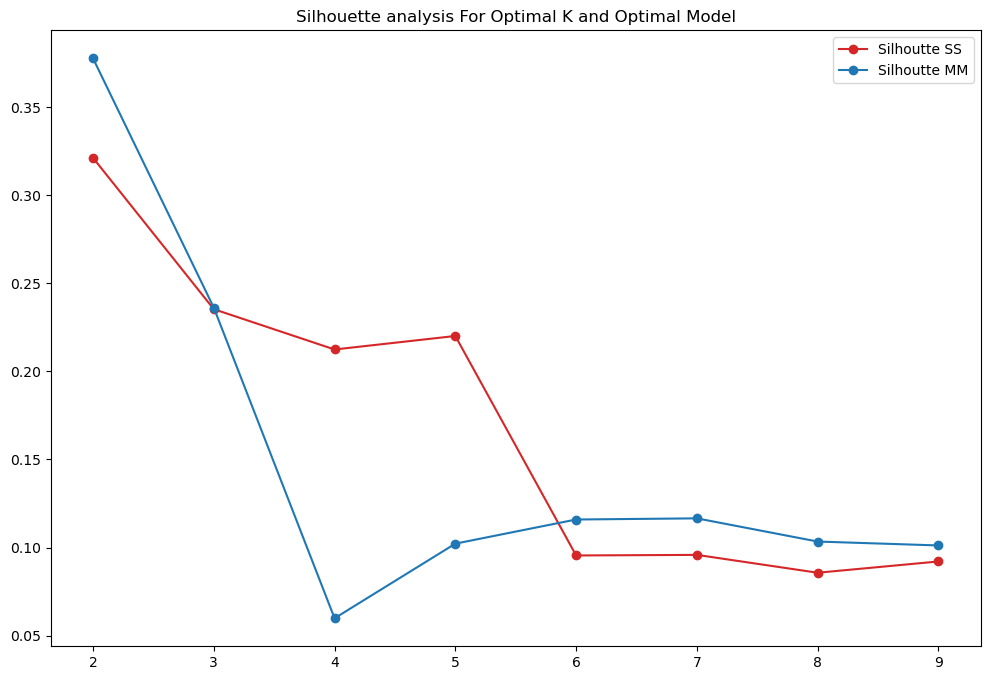

In [197]:
# Experiment number 1.
plt.figure(figsize=(12, 8))
plt.plot(range(2, 10), silhoutte_score_ss, "-o", c="C3")
plt.plot(range(2, 10), silhoutte_score_mm, "-o", c="C0")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS", "Silhoutte MM"]);

In [198]:
# Experiment number 2. (1/2)
silhoutte_score_ss = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="softdtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_ss = km.fit_predict(X_ss)
    score_ss = silhouette_score(X_ss, y_pred_ss, metric="softdtw")
    silhoutte_score_ss.append(score_ss)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 25.87 seconds to calculate.
K = 3. Took 22.27 seconds to calculate.
K = 4. Took 24.06 seconds to calculate.
K = 5. Took 24.99 seconds to calculate.
K = 6. Took 29.75 seconds to calculate.
K = 7. Took 27.01 seconds to calculate.
K = 8. Took 29.75 seconds to calculate.
K = 9. Took 31.79 seconds to calculate.


In [199]:
# Experiment number 2. (2/2)
silhoutte_score_mm = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="softdtw", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_mm = km.fit_predict(X_mm)
    score_mm = silhouette_score(X_mm, y_pred_mm, metric="softdtw")
    silhoutte_score_mm.append(score_mm)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 9.73 seconds to calculate.
K = 3. Took 9.15 seconds to calculate.
K = 4. Took 11.30 seconds to calculate.
K = 5. Took 11.98 seconds to calculate.
K = 6. Took 12.15 seconds to calculate.
K = 7. Took 14.26 seconds to calculate.
K = 8. Took 19.50 seconds to calculate.
K = 9. Took 23.70 seconds to calculate.


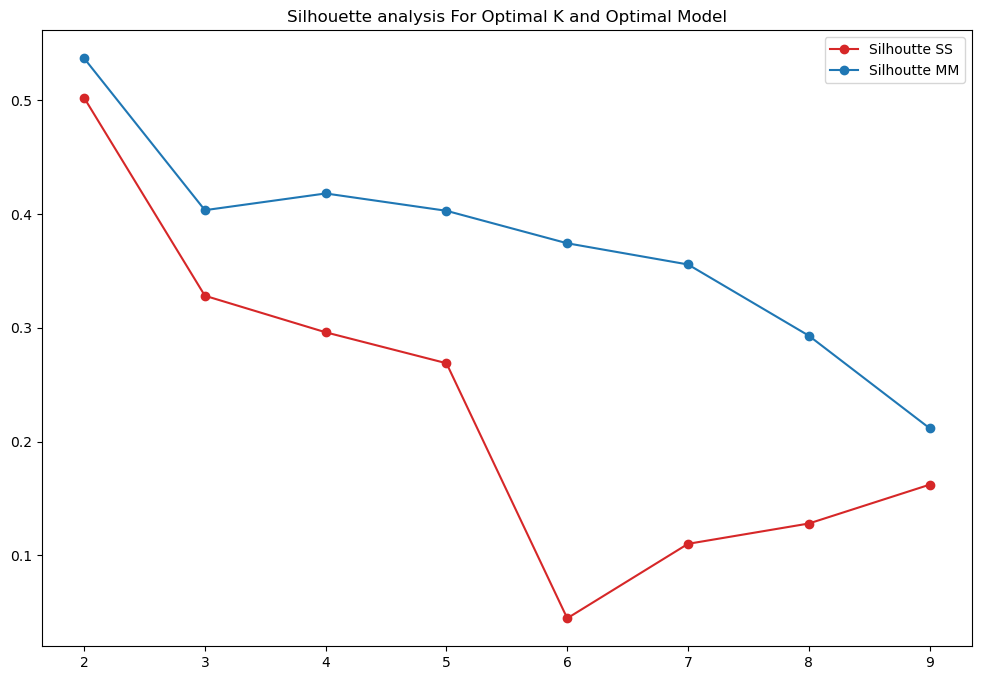

In [200]:
# Experiment number 2.
plt.figure(figsize=(12, 8))
plt.plot(range(2, 10), silhoutte_score_ss, "-o", c="C3")
plt.plot(range(2, 10), silhoutte_score_mm, "-o", c="C0")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS", "Silhoutte MM"]);

In [201]:
# Experiment number 3. (1/2)
silhoutte_score_ss = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_ss = km.fit_predict(X_ss)
    score_ss = silhouette_score(X_ss, y_pred_ss, metric="euclidean")
    silhoutte_score_ss.append(score_ss)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 0.04 seconds to calculate.
K = 3. Took 0.02 seconds to calculate.
K = 4. Took 0.02 seconds to calculate.
K = 5. Took 0.02 seconds to calculate.
K = 6. Took 0.02 seconds to calculate.
K = 7. Took 0.02 seconds to calculate.
K = 8. Took 0.02 seconds to calculate.
K = 9. Took 0.02 seconds to calculate.


In [202]:
# Experiment number 3. (2/2)
silhoutte_score_mm = []

for i in range(2, 10):

    start = time.time()

    km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=20, max_iter_barycenter=10, random_state=0)
    y_pred_mm = km.fit_predict(X_mm)
    score_mm = silhouette_score(X_mm, y_pred_mm, metric="euclidean")
    silhoutte_score_mm.append(score_mm)

    stop = time.time()
    duration = stop - start

    print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

K = 2. Took 0.03 seconds to calculate.
K = 3. Took 0.03 seconds to calculate.
K = 4. Took 0.02 seconds to calculate.
K = 5. Took 0.02 seconds to calculate.
K = 6. Took 0.02 seconds to calculate.
K = 7. Took 0.03 seconds to calculate.
K = 8. Took 0.02 seconds to calculate.
K = 9. Took 0.02 seconds to calculate.


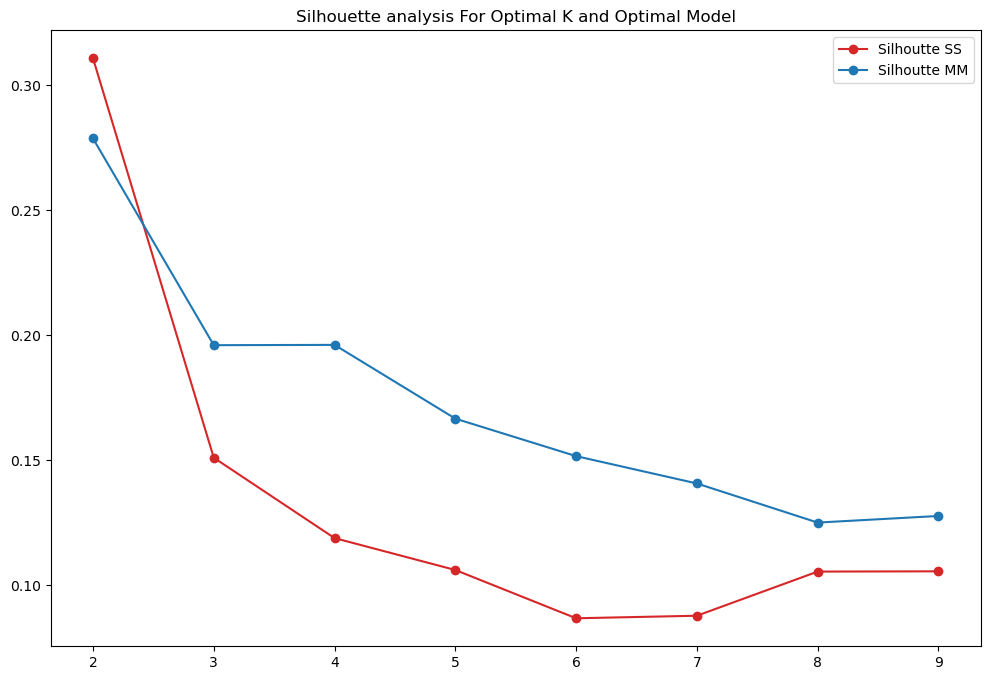

In [203]:
# Experiment number 3.
plt.figure(figsize=(12, 8))
plt.plot(range(2, 10), silhoutte_score_ss, "-o", c="C3")
plt.plot(range(2, 10), silhoutte_score_mm, "-o", c="C0")
plt.title("Silhouette analysis For Optimal K and Optimal Model")
plt.legend(["Silhoutte SS", "Silhoutte MM"]);

K-means will be run with the normalization technique and the parameters that have the highest value of the silhouette.

The goal is to take a deeper look at the groups suggested by the best match. <br>
This should allow us to have a better discussion about the results of this implementation. <br>

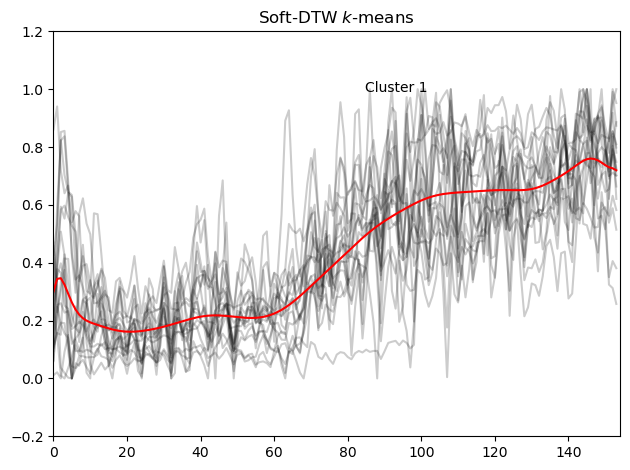

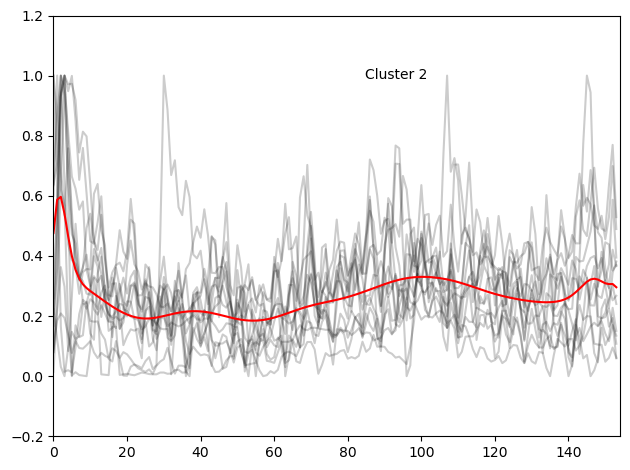

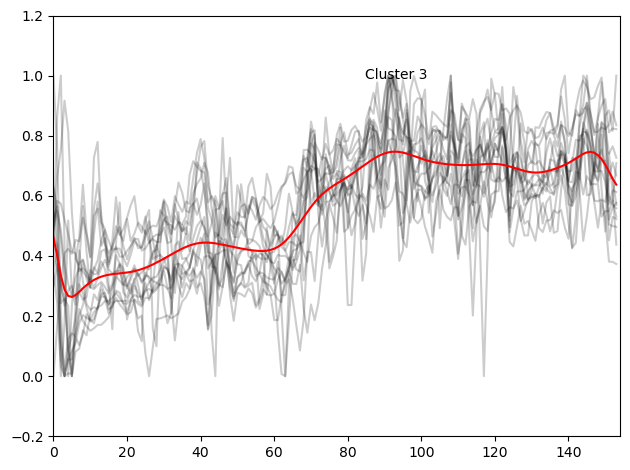

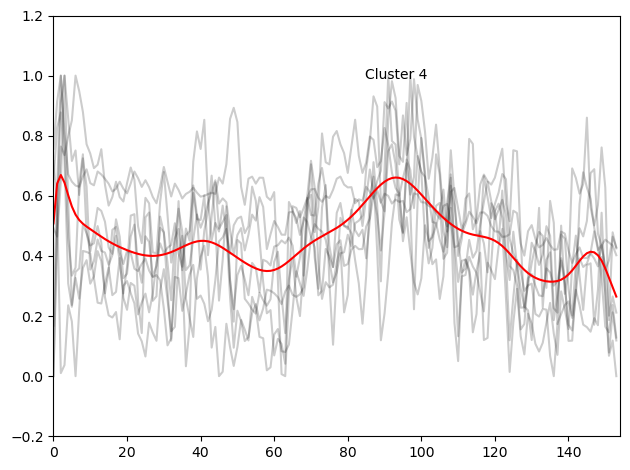

In [204]:
# Based on the Silhoutte Score the best K = 4 , the best metric is , and the best tecnique to normalize is MinMax
km = TimeSeriesKMeans(n_clusters=4, metric="softdtw", max_iter=20, max_iter_barycenter=10, random_state=0)
y_pred_mm = km.fit_predict(X_mm)

for yi in range(len(np.unique(y_pred_mm))):
    for xx in X_mm[y_pred_mm == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, X_mm.shape[1])
    plt.ylim(-0.2, 1.2)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1), transform=plt.gca().transAxes)
    if yi == 0:
        plt.title("Soft-DTW $k$-means")

    plt.tight_layout()
    plt.show();

In [205]:
for i in range(len(np.unique(y_pred_mm))):
    count = (sum(y_pred_mm == i)/len(y_pred_mm))*100
    print(f"The {count:.2f}% of the observations fall into Cluster {i + 1}")

The 33.96% of the observations fall into Cluster 1
The 24.53% of the observations fall into Cluster 2
The 28.30% of the observations fall into Cluster 3
The 13.21% of the observations fall into Cluster 4


In [206]:
Selected_Products_Moving_Mean_pred= Selected_Products_Moving_Mean.T.copy()
Selected_Products_Moving_Mean_pred.head()

,0,1,2,3,4,5,6,7,8,9,...,144,145,146,147,148,149,150,151,152,153
1000031,5022.8505,4681.1305,3077.6035,3152.5875,3032.2150,1852.3485,3030.5045,3964.0420,3445.4895,3061.6655,...,5719.75,5984.625,5747.0,5323.0470,5102.9220,5457.8750,5470.9690,4799.393,4734.3225,4670.2935
1000497,2084.5000,2749.0000,3723.5000,3655.5000,3307.5000,2980.0000,2890.6250,2736.6250,2797.2655,2294.4235,...,2765.00,2824.000,2777.0,2620.5000,2595.0000,2691.3125,2518.8125,2683.000,3057.5000,2594.0000
1000498,819.8330,700.1665,262.6670,283.8335,440.6665,398.1665,254.6670,429.6675,583.3335,580.6665,...,759.00,933.167,698.0,650.3335,704.0005,855.0000,749.8335,402.000,632.1670,590.0005
1000794,5496.5000,5996.0000,7546.0000,7941.0000,6352.0000,4564.0000,3954.0000,3398.5000,3646.5000,4543.0000,...,2135.00,2579.500,2572.5,1967.0000,1946.5000,1940.5000,1565.0000,1653.000,1880.5000,1652.0000
1000812,24.0000,39.0000,54.5000,47.5000,24.5000,44.0000,70.0000,53.5000,42.0000,39.6250,...,98.50,123.000,117.0,71.0000,47.5000,60.0000,48.0000,40.000,52.5000,56.5000


In [207]:
Selected_Products_Moving_Mean_pred = Selected_Products_Moving_Mean_pred.reset_index().rename(columns={'index': 'Materiales'})
Selected_Products_Moving_Mean_pred['Cluster'] = pd.Series(y_pred_mm, dtype=int)
Selected_Products_Moving_Mean_pred.head()

,Materiales,0,1,2,3,4,5,6,7,8,...,145,146,147,148,149,150,151,152,153,Cluster
0,1000031,5022.8505,4681.1305,3077.6035,3152.5875,3032.2150,1852.3485,3030.5045,3964.0420,3445.4895,...,5984.625,5747.0,5323.0470,5102.9220,5457.8750,5470.9690,4799.393,4734.3225,4670.2935,2
1,1000497,2084.5000,2749.0000,3723.5000,3655.5000,3307.5000,2980.0000,2890.6250,2736.6250,2797.2655,...,2824.000,2777.0,2620.5000,2595.0000,2691.3125,2518.8125,2683.000,3057.5000,2594.0000,1
2,1000498,819.8330,700.1665,262.6670,283.8335,440.6665,398.1665,254.6670,429.6675,583.3335,...,933.167,698.0,650.3335,704.0005,855.0000,749.8335,402.000,632.1670,590.0005,3
3,1000794,5496.5000,5996.0000,7546.0000,7941.0000,6352.0000,4564.0000,3954.0000,3398.5000,3646.5000,...,2579.500,2572.5,1967.0000,1946.5000,1940.5000,1565.0000,1653.000,1880.5000,1652.0000,1
4,1000812,24.0000,39.0000,54.5000,47.5000,24.5000,44.0000,70.0000,53.5000,42.0000,...,123.000,117.0,71.0000,47.5000,60.0000,48.0000,40.000,52.5000,56.5000,1


In [208]:
Selected_Products_Moving_Mean_pred.to_excel('Materiales_Cluster.xlsx', index=False)

In [209]:
Selected_Products_Moving_Mean_pred.Materiales[Selected_Products_Moving_Mean_pred.Cluster==3]

2     1000498
23    1012347
27    1017925
29    1019943
34    1031533
40    1042123
41    1042513
Name: Materiales, dtype: object

<Axes: >

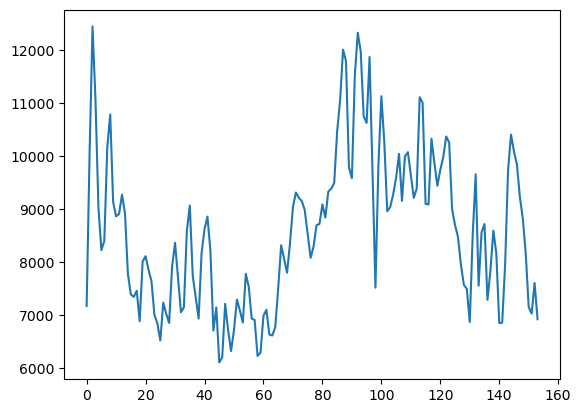

In [210]:
Selected_Products_Moving_Mean['1017925'].plot()

<Axes: >

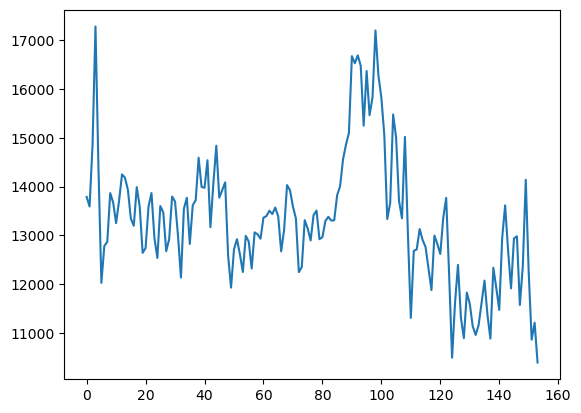

In [211]:
Selected_Products_Moving_Mean['1042513'].plot()

3


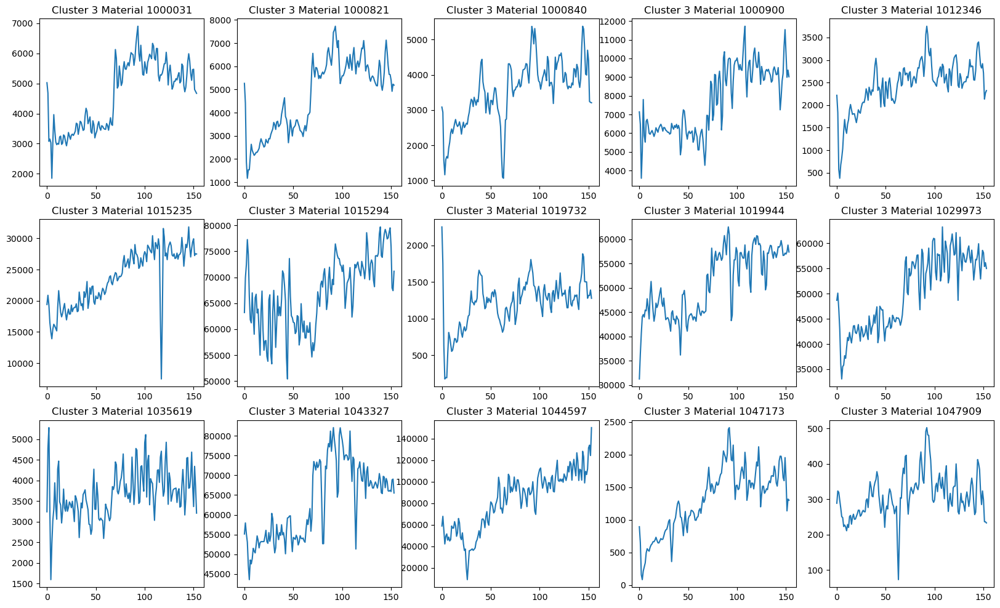

2


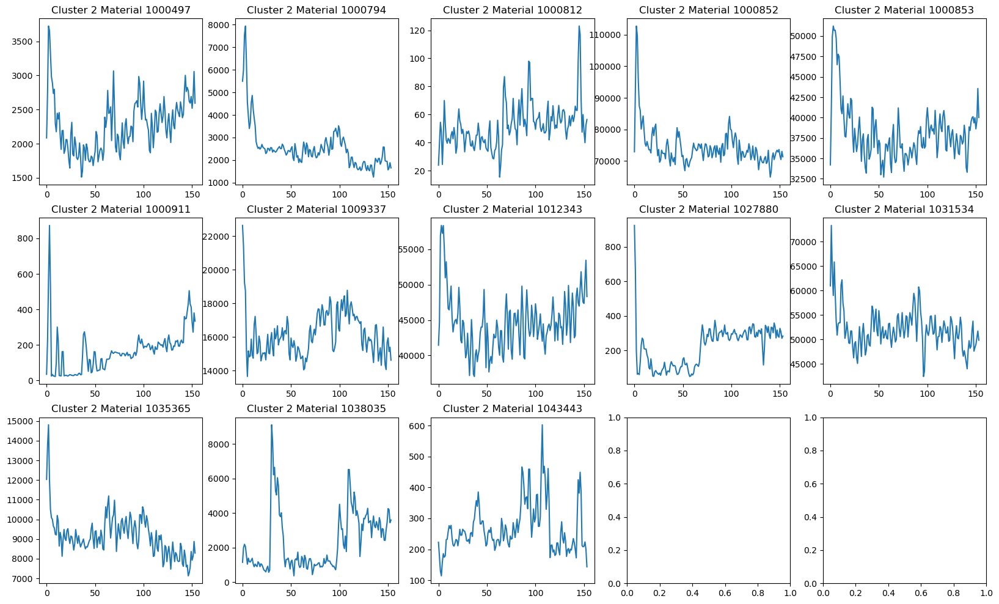

4


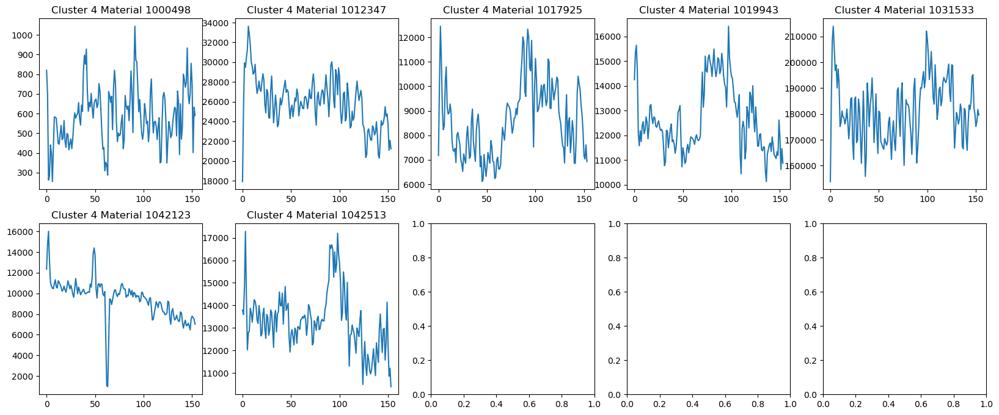

1


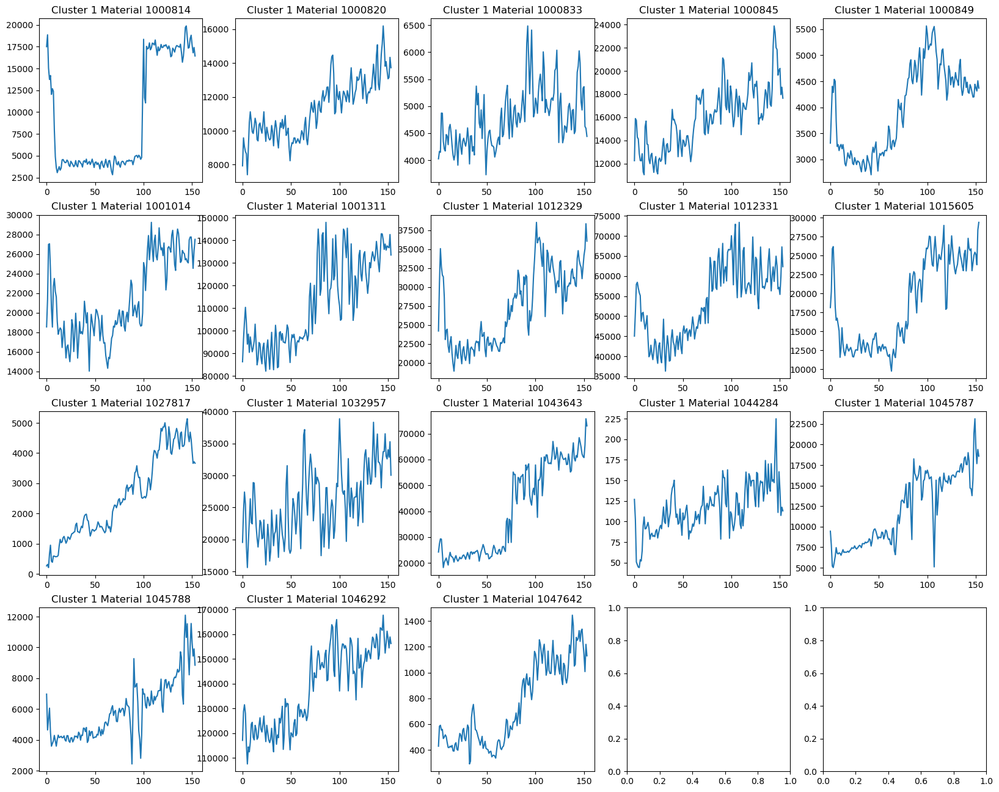

In [212]:
Selected_Products_Moving_Mean_pred_log = pd.melt(Selected_Products_Moving_Mean_pred, id_vars=['Materiales', 'Cluster'], var_name='Semana', value_name='Consumo')

# Get a list of unique clusters
clusters = Selected_Products_Moving_Mean_pred_log['Cluster'].unique()

# Create a graph for each cluster
for cluster in clusters:
    # Filter the dataframe by the current cluster
    df = Selected_Products_Moving_Mean_pred_log[Selected_Products_Moving_Mean_pred_log['Cluster'] == cluster]
    
    print(cluster+1)
    materials = df['Materiales'].unique()
    
    num_materials = len(materials)
    num_rows = int(num_materials / 5) if num_materials%5 == 0  else int(num_materials / 5) + 1  
    fig, axs = plt.subplots(num_rows, 5, figsize=(20, 4*num_rows))  
    
    for i, material in enumerate(materials):
        # Filter the dataframe by the current cluster and the current material
        df_filter = df[df['Materiales'] == material]
        
        # Calculate the position of the graph in the matrix
        row = int(i / 5)
        col = i % 5
        
        # Create the graph at the corresponding position
        axs[row, col].plot(df_filter['Semana'], df_filter['Consumo'])
        axs[row, col].set_title(f'Cluster {cluster+1} Material {material}')
    
    plt.show()

# Laboratorio ML2

In [213]:
Selected_Products

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,4553.695,2347.000,544.333,5981.0,24.0,14851.851,7356.609,4503.815,3573.975,2498.545,...,249.335,22960.040,110.939,50176.700754,10148.760,8880.0,113025.608,732.990088,385.406163,269.992169
1,5492.006,1822.000,1095.333,5012.0,24.0,20132.220,8500.055,6022.121,4475.146,3671.445,...,196.332,25470.400,142.875,67663.379795,8735.300,5064.0,121110.343,1053.363983,471.146709,307.053783
2,3870.255,3676.000,305.000,6980.0,54.0,17560.170,10662.832,2794.617,3850.982,2205.495,...,152.667,29341.360,61.605,68121.540213,6737.240,4227.0,136362.053,251.148000,695.461646,339.363365
3,2284.952,3771.000,220.334,8112.0,55.0,12551.380,7451.010,962.701,4442.017,934.211,...,106.336,29283.440,39.896,42056.192999,3649.804,6486.0,126563.382,60.121000,486.295974,299.179125
4,4020.223,3540.000,347.333,7770.0,40.0,14913.400,10086.938,1370.585,5302.665,1392.940,...,122.336,29132.040,54.938,42498.666564,6386.272,5639.0,129238.568,103.010000,620.067963,293.661153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,5917.500,2829.625,1180.000,1768.0,56.0,19041.167,13598.722,5955.619,5770.000,5272.000,...,217.333,62679.652,190.000,119587.000000,23782.500,12382.0,165999.862,2275.922000,1326.000000,340.536000
151,5024.438,2208.000,319.667,1362.0,40.0,16284.000,12549.986,4863.438,4954.501,3553.500,...,203.334,58798.000,86.875,143479.000000,15363.100,8245.0,150738.864,990.373000,944.859000,256.292000
152,4574.348,3158.000,484.333,1944.0,40.0,17300.000,13760.514,4977.264,4293.500,2932.500,...,244.334,72342.000,127.875,124350.000000,19986.400,10641.0,158124.138,1281.604000,1070.000000,216.120000
153,4894.297,2957.000,780.001,1817.0,65.0,17495.556,14919.447,5479.046,4888.500,3505.500,...,155.001,79143.000,106.937,124272.000000,18814.900,9173.0,159626.702,1352.169000,1368.092000,255.791000


1) Period-to-period variation: (Ot-Ot-1)/Ot-1
2) Average of the entire series
3) Median of the entire series
4) Maximum and Minimum
5) Deviation of the whole series
6) Same information for shorter periods of time

In [214]:
descriptive = pd.DataFrame(Selected_Products.describe())
descriptive= descriptive.drop(['count','std'], axis=0)
descriptive

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
mean,4599.350084,2276.308084,586.679802,2551.757677,52.128394,9416.252955,11304.528806,4732.535135,4787.227639,3514.219577,...,267.390426,40856.074413,115.959845,83089.589414,12019.948858,5977.836735,138417.700716,1302.348297,755.056468,309.10912
min,1660.490000,1489.608000,138.334000,1176.000000,9.000000,2490.437000,7183.280000,962.701000,3572.226000,934.211000,...,106.336000,17370.927000,34.000000,6960.000000,1778.716000,832.000000,99817.045000,60.121000,40.000000,65.62400
25%,3460.043500,1905.300500,472.499500,1955.500000,40.000000,4005.695500,9937.511000,3269.679000,4320.973000,2903.056000,...,210.806000,23640.719500,92.062500,61707.830264,7796.870000,4278.016500,124258.954500,968.838000,473.960952,264.22800
50%,4849.459000,2226.000000,561.667000,2374.000000,50.000000,4884.054000,11390.500000,5269.500000,4701.500000,3651.500000,...,241.967000,34089.001000,111.750000,84264.000000,11289.601000,5554.277000,136472.263000,1366.357000,654.143000,305.99700
75%,5536.347000,2607.000000,682.334000,2754.000000,60.515500,17110.297500,12489.250000,6016.272000,5159.844000,4109.299000,...,302.961000,58700.937500,135.115000,104180.000000,16231.399500,7233.000000,154544.621500,1623.759000,1067.898500,341.66250
max,6927.294000,3771.000000,1180.000000,8112.000000,123.000000,20712.000000,17394.500000,8138.000000,6824.315000,5837.500000,...,659.337000,79143.000000,246.000000,176184.000000,23782.500000,13842.000000,173290.630000,2554.728000,1545.000000,538.08100


In [215]:
middle_table =  pd.concat([Selected_Products, descriptive], ignore_index=True)
middle_table

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,4553.6950,2347.0000,544.3330,5981.0,24.0000,14851.8510,7356.609,4503.815,3573.975,2498.545,...,249.335,22960.0400,110.9390,50176.700754,10148.7600,8880.0000,113025.6080,732.990088,385.406163,269.992169
1,5492.0060,1822.0000,1095.3330,5012.0,24.0000,20132.2200,8500.055,6022.121,4475.146,3671.445,...,196.332,25470.4000,142.8750,67663.379795,8735.3000,5064.0000,121110.3430,1053.363983,471.146709,307.053783
2,3870.2550,3676.0000,305.0000,6980.0,54.0000,17560.1700,10662.832,2794.617,3850.982,2205.495,...,152.667,29341.3600,61.6050,68121.540213,6737.2400,4227.0000,136362.0530,251.148000,695.461646,339.363365
3,2284.9520,3771.0000,220.3340,8112.0,55.0000,12551.3800,7451.010,962.701,4442.017,934.211,...,106.336,29283.4400,39.8960,42056.192999,3649.8040,6486.0000,126563.3820,60.121000,486.295974,299.179125
4,4020.2230,3540.0000,347.3330,7770.0,40.0000,14913.4000,10086.938,1370.585,5302.665,1392.940,...,122.336,29132.0400,54.9380,42498.666564,6386.2720,5639.0000,129238.5680,103.010000,620.067963,293.661153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
156,1660.4900,1489.6080,138.3340,1176.0,9.0000,2490.4370,7183.280,962.701,3572.226,934.211,...,106.336,17370.9270,34.0000,6960.000000,1778.7160,832.0000,99817.0450,60.121000,40.000000,65.624000
157,3460.0435,1905.3005,472.4995,1955.5,40.0000,4005.6955,9937.511,3269.679,4320.973,2903.056,...,210.806,23640.7195,92.0625,61707.830264,7796.8700,4278.0165,124258.9545,968.838000,473.960952,264.228000
158,4849.4590,2226.0000,561.6670,2374.0,50.0000,4884.0540,11390.500,5269.500,4701.500,3651.500,...,241.967,34089.0010,111.7500,84264.000000,11289.6010,5554.2770,136472.2630,1366.357000,654.143000,305.997000
159,5536.3470,2607.0000,682.3340,2754.0,60.5155,17110.2975,12489.250,6016.272,5159.844,4109.299,...,302.961,58700.9375,135.1150,104180.000000,16231.3995,7233.0000,154544.6215,1623.759000,1067.898500,341.662500


In [216]:
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(middle_table)
middle_table_mm = pd.DataFrame(scaled_mm, columns=middle_table.columns, index=middle_table.index)
middle_table_mm.head()

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,0.549328,0.375820,0.389759,0.692762,0.131579,0.678395,0.016974,0.493514,0.000538,0.319038,...,0.258587,0.090480,0.362920,0.255382,0.380391,0.618601,0.179773,0.269729,0.229506,0.432565
1,0.727484,0.145697,0.918720,0.553057,0.131579,0.968182,0.128954,0.705116,0.277643,0.558244,...,0.162741,0.131119,0.513561,0.358716,0.316154,0.325288,0.289809,0.398156,0.286476,0.511009
2,0.419565,0.958359,0.159999,0.836794,0.394737,0.827027,0.340758,0.255309,0.085716,0.259272,...,0.083781,0.193784,0.130212,0.361424,0.225349,0.260953,0.497390,0.076576,0.435523,0.579395
3,0.118566,1.000000,0.078720,1.000000,0.403509,0.552145,0.026219,0.000000,0.267456,0.000000,...,0.000000,0.192846,0.027811,0.207395,0.085035,0.434589,0.364027,0.000000,0.296542,0.494342
4,0.448039,0.898746,0.200639,0.950692,0.271930,0.681773,0.284360,0.056846,0.532101,0.093555,...,0.028933,0.190395,0.098764,0.210010,0.209398,0.369485,0.400437,0.017193,0.385427,0.482662


In [217]:
Variation_bet_period = Selected_Products.pct_change()
Variation_bet_period = Variation_bet_period.dropna()
Variation_bet_period

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
1,0.206055,-0.223690,1.012248,-0.162013,0.000000,0.355536,0.155431,0.337116,0.252148,0.469433,...,-0.212577,0.109336,0.287870,0.348502,-0.139274,-0.429730,0.071530,0.437078,0.222468,0.137269
2,-0.295293,1.017563,-0.721546,0.392658,1.250000,-0.127758,0.254443,-0.535941,-0.139473,-0.399284,...,-0.222404,0.151979,-0.568819,0.006771,-0.228734,-0.165284,0.125932,-0.761575,0.476104,0.105225
3,-0.409612,0.025843,-0.277593,0.162178,0.018519,-0.285236,-0.301217,-0.655516,0.153476,-0.576417,...,-0.303478,-0.001974,-0.352390,-0.382630,-0.458264,0.534422,-0.071858,-0.760615,-0.300758,-0.118411
4,0.759434,-0.061257,0.576393,-0.042160,-0.272727,0.188188,0.353768,0.423687,0.193752,0.491034,...,0.150466,-0.005170,0.377030,0.010521,0.749758,-0.130589,0.021137,0.713378,0.275083,-0.018444
5,-0.491519,-0.131356,0.537429,-0.364994,-0.775000,-0.097703,-0.287863,0.239763,-0.163506,0.293850,...,0.613066,-0.380200,-0.381121,0.323854,-0.222856,-0.403618,-0.219441,2.158189,-0.196925,-0.125011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,0.183914,0.108353,1.226415,-0.163275,-0.125000,0.025759,0.007539,0.117083,0.178513,0.277882,...,0.092120,0.051794,0.450382,0.147140,0.057136,0.153853,0.061197,0.396078,0.173951,0.112874
151,-0.150919,-0.219685,-0.729096,-0.229638,-0.285714,-0.144800,-0.077120,-0.183387,-0.141334,-0.325967,...,-0.064413,-0.061928,-0.542763,0.199788,-0.354017,-0.334114,-0.091934,-0.564848,-0.287437,-0.247386
152,-0.089580,0.430254,0.515117,0.427313,0.000000,0.062393,0.096457,0.023404,-0.133414,-0.174757,...,0.201639,0.230348,0.471942,-0.133323,0.300935,0.290600,0.048994,0.294062,0.132444,-0.156743
153,0.069944,-0.063648,0.610464,-0.065329,0.625000,0.011304,0.084222,0.100815,0.138582,0.195396,...,-0.365618,0.094012,-0.163738,-0.000627,-0.058615,-0.137957,0.009502,0.055060,0.278591,0.183560


In [218]:
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(Variation_bet_period)
Variation_bet_period_mm = pd.DataFrame(scaled_mm, columns=Variation_bet_period.columns, index=Variation_bet_period.index)
Variation_bet_period_mm

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
1,0.325718,0.170748,0.375347,0.245550,0.090614,0.291712,0.697189,0.565438,0.820048,0.456732,...,0.224089,0.382378,0.381345,0.408110,0.058989,0.029237,0.482733,0.410531,0.079140,0.234510
2,0.091624,1.000000,0.010360,0.756943,0.236765,0.160843,0.848355,0.068114,0.297282,0.077355,...,0.219836,0.411107,0.066118,0.285161,0.050863,0.050440,0.572394,0.000000,0.096617,0.226049
3,0.038245,0.337455,0.103818,0.544446,0.092779,0.118200,0.000000,0.000000,0.688334,0.000000,...,0.184745,0.307388,0.145755,0.145061,0.030014,0.106540,0.246414,0.000329,0.043086,0.166995
4,0.584107,0.279265,0.283593,0.356052,0.058726,0.246396,1.000000,0.614752,0.742096,0.466165,...,0.381226,0.305235,0.414153,0.286510,0.139741,0.053221,0.399680,0.505162,0.082765,0.193393
5,0.000000,0.232434,0.275391,0.058407,0.000000,0.168981,0.020387,0.509982,0.265202,0.380053,...,0.581454,0.052574,0.135183,0.399242,0.051397,0.031330,0.003181,1.000000,0.050241,0.165252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150,0.315380,0.392578,0.420432,0.244387,0.075999,0.202413,0.471394,0.440099,0.721755,0.373080,...,0.355972,0.343612,0.441143,0.335663,0.076829,0.076027,0.465703,0.396489,0.075797,0.228068
151,0.159036,0.173424,0.008771,0.183202,0.057208,0.156228,0.342140,0.268941,0.294798,0.109373,...,0.288220,0.266996,0.075705,0.354605,0.039483,0.036903,0.213326,0.067378,0.044004,0.132938
152,0.187677,0.607632,0.270694,0.788895,0.090614,0.212333,0.607149,0.386737,0.305370,0.175408,...,0.403375,0.463905,0.449077,0.234758,0.098974,0.086991,0.445591,0.361549,0.072936,0.156873
153,0.262164,0.277668,0.290766,0.334690,0.163690,0.198499,0.588469,0.430832,0.668451,0.337058,...,0.157848,0.372054,0.215171,0.282499,0.066315,0.052631,0.380504,0.279692,0.083007,0.246734


In [219]:
Final_table =  pd.concat([Variation_bet_period_mm, Variation_bet_period_mm], ignore_index=True)
Final_table

material,1000031,1000497,1000498,1000794,1000812,1000814,1000820,1000821,1000833,1000840,...,1043443,1043643,1044284,1044597,1045787,1045788,1046292,1047173,1047642,1047909
0,0.325718,0.170748,0.375347,0.245550,0.090614,0.291712,0.697189,0.565438,0.820048,0.456732,...,0.224089,0.382378,0.381345,0.408110,0.058989,0.029237,0.482733,0.410531,0.079140,0.234510
1,0.091624,1.000000,0.010360,0.756943,0.236765,0.160843,0.848355,0.068114,0.297282,0.077355,...,0.219836,0.411107,0.066118,0.285161,0.050863,0.050440,0.572394,0.000000,0.096617,0.226049
2,0.038245,0.337455,0.103818,0.544446,0.092779,0.118200,0.000000,0.000000,0.688334,0.000000,...,0.184745,0.307388,0.145755,0.145061,0.030014,0.106540,0.246414,0.000329,0.043086,0.166995
3,0.584107,0.279265,0.283593,0.356052,0.058726,0.246396,1.000000,0.614752,0.742096,0.466165,...,0.381226,0.305235,0.414153,0.286510,0.139741,0.053221,0.399680,0.505162,0.082765,0.193393
4,0.000000,0.232434,0.275391,0.058407,0.000000,0.168981,0.020387,0.509982,0.265202,0.380053,...,0.581454,0.052574,0.135183,0.399242,0.051397,0.031330,0.003181,1.000000,0.050241,0.165252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
303,0.315380,0.392578,0.420432,0.244387,0.075999,0.202413,0.471394,0.440099,0.721755,0.373080,...,0.355972,0.343612,0.441143,0.335663,0.076829,0.076027,0.465703,0.396489,0.075797,0.228068
304,0.159036,0.173424,0.008771,0.183202,0.057208,0.156228,0.342140,0.268941,0.294798,0.109373,...,0.288220,0.266996,0.075705,0.354605,0.039483,0.036903,0.213326,0.067378,0.044004,0.132938
305,0.187677,0.607632,0.270694,0.788895,0.090614,0.212333,0.607149,0.386737,0.305370,0.175408,...,0.403375,0.463905,0.449077,0.234758,0.098974,0.086991,0.445591,0.361549,0.072936,0.156873
306,0.262164,0.277668,0.290766,0.334690,0.163690,0.198499,0.588469,0.430832,0.668451,0.337058,...,0.157848,0.372054,0.215171,0.282499,0.066315,0.052631,0.380504,0.279692,0.083007,0.246734


In [220]:
Final_table_transposed = Final_table.T
Final_table_transposed.head()

,0,1,2,3,4,5,6,7,8,9,...,298,299,300,301,302,303,304,305,306,307
material,,,,,,,,,,,,,,,,,,,,,
1000031,0.325718,0.091624,0.038245,0.584107,0.000000,0.141858,1.000000,0.136877,0.207777,0.145724,...,0.262291,0.240697,0.181929,0.209680,0.210734,0.315380,0.159036,0.187677,0.262164,0.186764
1000497,0.170748,1.000000,0.337455,0.279265,0.232434,0.278910,0.322795,0.246549,0.434396,0.000000,...,0.288579,0.382590,0.241832,0.328656,0.298909,0.392578,0.173424,0.607632,0.277668,0.156164
1000498,0.375347,0.010360,0.103818,0.283593,0.275391,0.055159,0.149952,0.473620,0.142315,0.182256,...,0.252523,0.181193,0.043156,0.389039,0.078817,0.420432,0.008771,0.270694,0.290766,0.059697
1000794,0.245550,0.756943,0.544446,0.356052,0.058407,0.256645,0.289403,0.238281,0.731954,0.540774,...,0.423871,0.744916,0.136917,0.234839,0.567405,0.244387,0.183202,0.788895,0.334690,0.227475
1000812,0.090614,0.236765,0.092779,0.058726,0.000000,1.000000,0.063974,0.061863,0.070280,0.100614,...,0.168035,0.090614,0.079207,0.006346,0.215078,0.075999,0.057208,0.090614,0.163690,0.060034


## PCA

In [221]:
Final_table_transposed.shape

(53, 308)

In [222]:
Num_Componentes = Final_table_transposed.shape[1]

pca = PCA(n_components = 53)
# Fit the PCA object to the dataset
pca.fit(Final_table_transposed)

PCA(n_components=53)

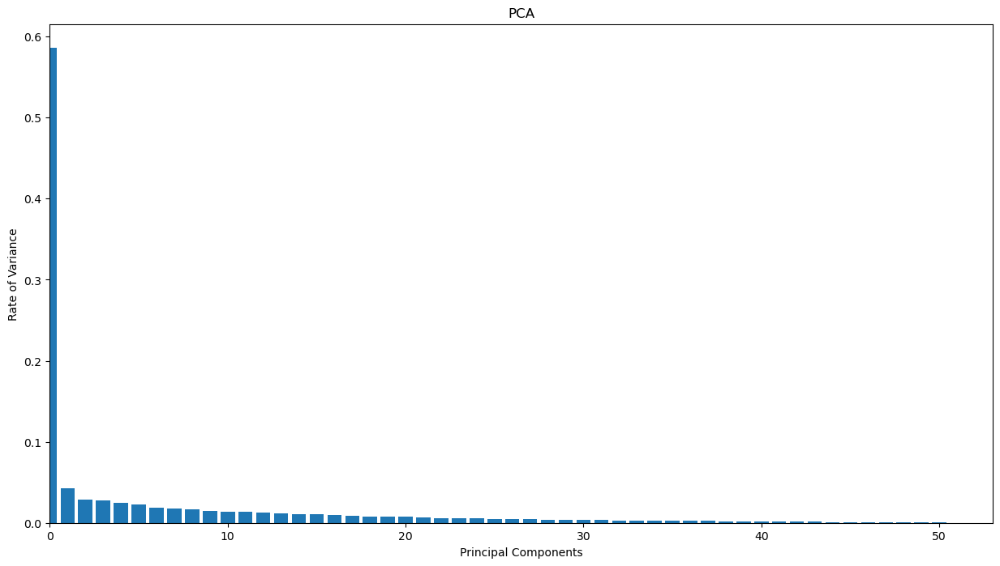

In [223]:
Varianza = pca.explained_variance_ratio_ # Calculate the rate of variance of the components and generate the principal components

fig = plt.figure(figsize=(15,8))
plt.bar(np.arange(len(Varianza)), Varianza)
plt.xlabel('Principal Components')
plt.ylabel('Rate of Variance')
plt.title('PCA')
plt.xlim(0, len(Varianza))
plt.show()

In [224]:
importance_components    = pd.DataFrame(Varianza)
importance_components = importance_components.T
print("Percentage of Variance detected for the first 3 components: ", format(100*importance_components.loc[:,0:2].sum(axis = 1).values))
print("Percentage of Variance detected for the first 4 components: ", format(100*importance_components.loc[:,0:3].sum(axis = 1).values))
print("Percentage of Variance detected for the first 5 components: ", format(100*importance_components.loc[:,0:4].sum(axis = 1).values))
print("Percentage of Variance detected for the first 6 components: ", format(100*importance_components.loc[:,0:5].sum(axis = 1).values))
print("Percentage of Variance detected for the first 7 components: ", format(100*importance_components.loc[:,0:6].sum(axis = 1).values))
print("Percentage of Variance detected for the first 8 components: ", format(100*importance_components.loc[:,0:7].sum(axis = 1).values))
print("Percentage of Variance detected for the first 9 components: ", format(100*importance_components.loc[:,0:8].sum(axis = 1).values))

Percentage of Variance detected for the first 3 components:  [65.7511898]
Percentage of Variance detected for the first 4 components:  [68.56371206]
Percentage of Variance detected for the first 5 components:  [70.98645303]
Percentage of Variance detected for the first 6 components:  [73.28207268]
Percentage of Variance detected for the first 7 components:  [75.1805182]
Percentage of Variance detected for the first 8 components:  [76.97918851]
Percentage of Variance detected for the first 9 components:  [78.65413418]


In [225]:
# Create a PCA object with 10 components
pca = PCA(n_components = 10)

# Fit the data
pca.fit(Final_table_transposed)
# Transform the data using the PCA object
Tabla_transformada = pca.fit_transform(Final_table_transposed)

print(Tabla_transformada.shape)

(53, 10)


In [226]:
Tabla_transformada.shape

(53, 10)

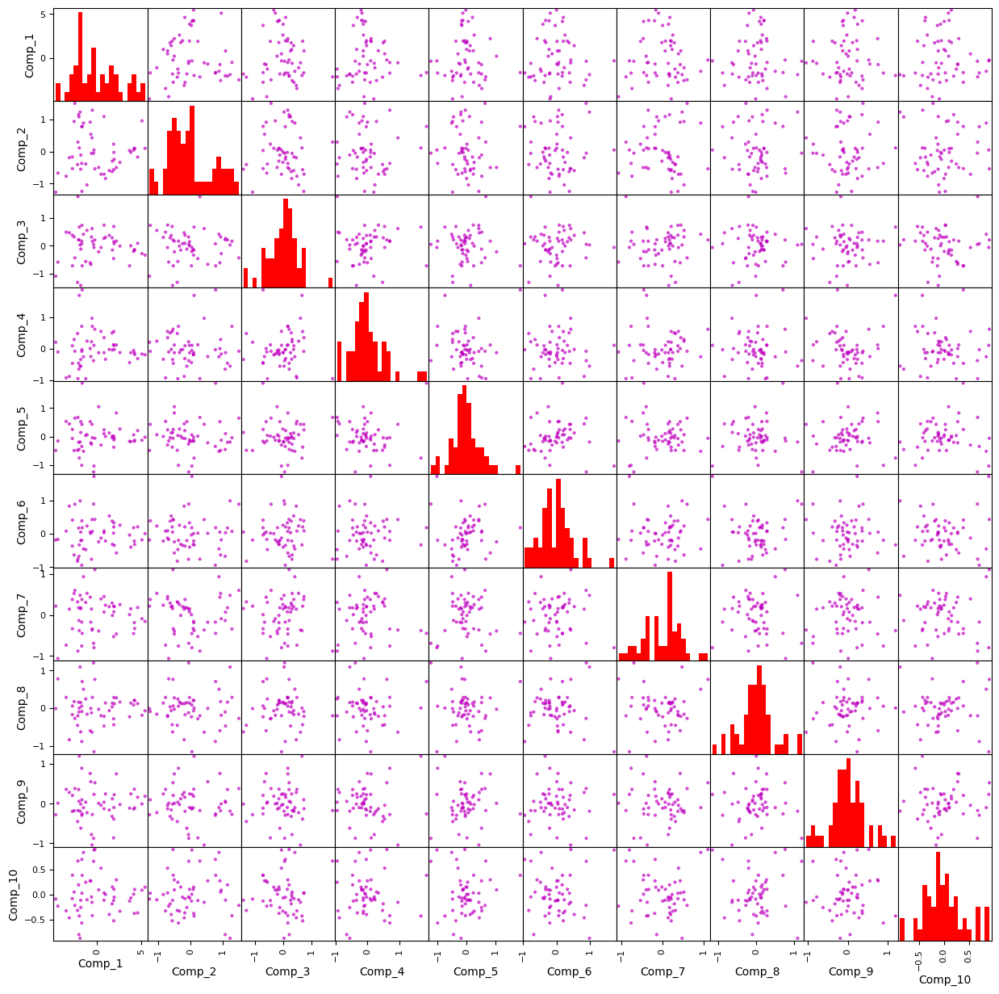

In [227]:
names = ["Comp_1", "Comp_2", "Comp_3", "Comp_4", "Comp_5", "Comp_6", "Comp_7","Comp_8","Comp_9","Comp_10"]
X_Norm_PCA = pd.DataFrame(Tabla_transformada, columns = names)
pd.plotting.scatter_matrix(X_Norm_PCA, alpha=0.7, figsize=(15,15),
                           color = 'm', hist_kwds = {'bins':20, 'color':'red'})
plt.show()

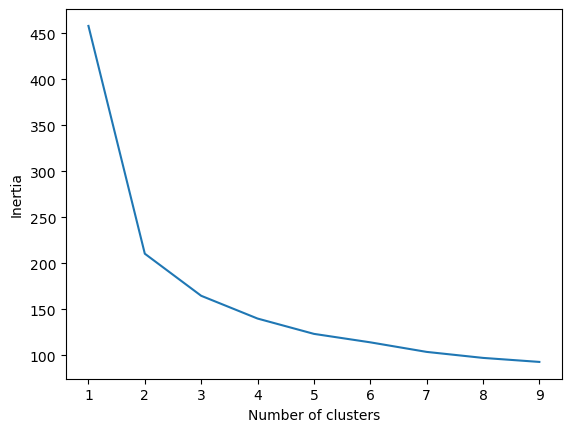

In [228]:
# The Elbow method
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(Tabla_transformada)
    inertia.append(kmeans.inertia_)
plt.plot(range(1, 10), inertia)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [229]:
# Apply clustering
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans.fit(Tabla_transformada)
clusters = kmeans.predict(Tabla_transformada)

For n_clusters = 2 The average silhouette_score is : 0.5002165069993134
For n_clusters = 3 The average silhouette_score is : 0.4240056492581798
For n_clusters = 4 The average silhouette_score is : 0.3481901496714794
For n_clusters = 5 The average silhouette_score is : 0.30557331157617745


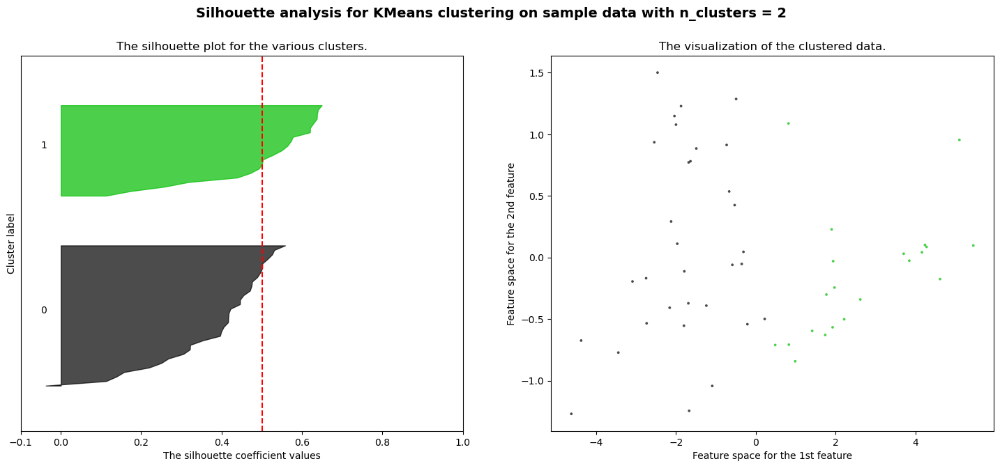

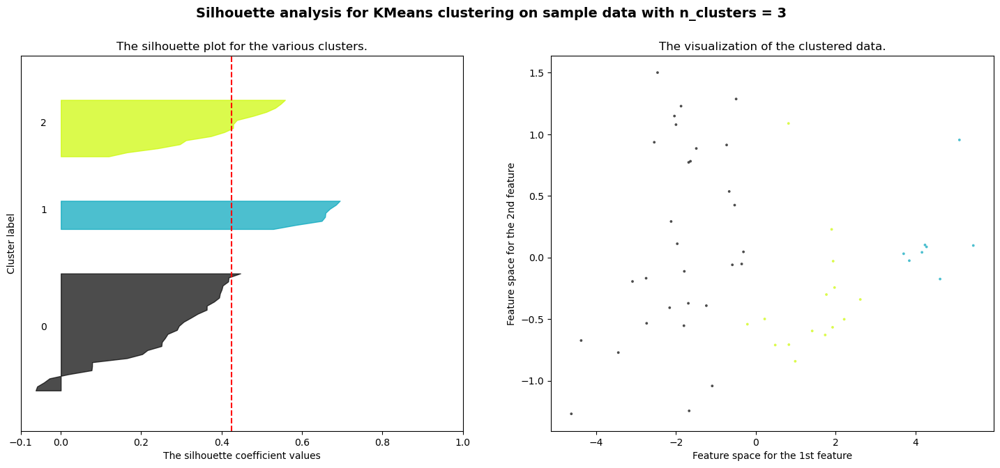

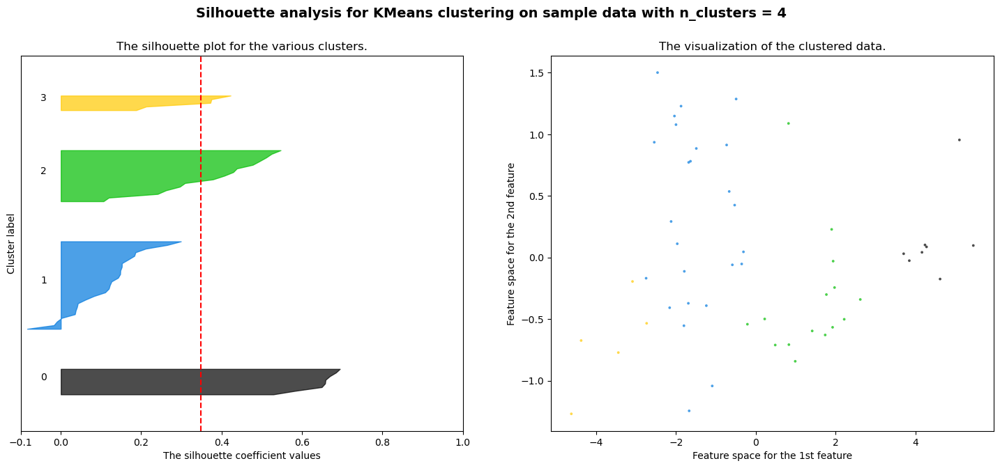

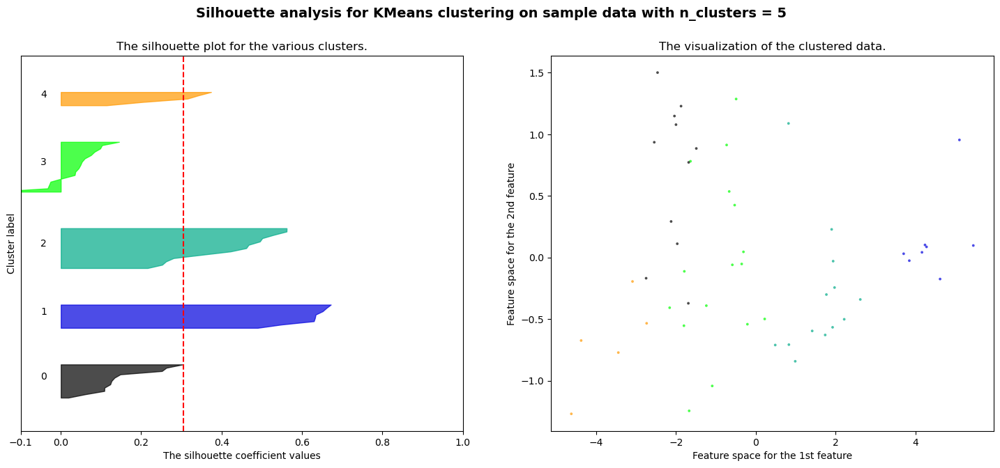

In [230]:
range_n_clusters = [2, 3, 4, 5]
X=Tabla_transformada.copy()
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize KMeans
    kmeans = KMeans(n_clusters=n_clusters)
    # fit the data & predict cluster labels
    kmeans.fit(X)
    cluster_kmeans = kmeans.predict(X)

    silhouette_avg = silhouette_score(X, cluster_kmeans)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_kmeans)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_kmeans == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_kmeans.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

## TSNE

In [231]:
tsne = TSNE(n_components = 2, learning_rate = 300, perplexity = 30, method = 'barnes_hut', 
            early_exaggeration = 12, init = 'random', random_state = 0)

In [232]:
Data_TSNE = tsne.fit_transform(Final_table_transposed) 
print(Final_table_transposed.shape) 
print(Data_TSNE.shape)

(53, 308)
(53, 2)


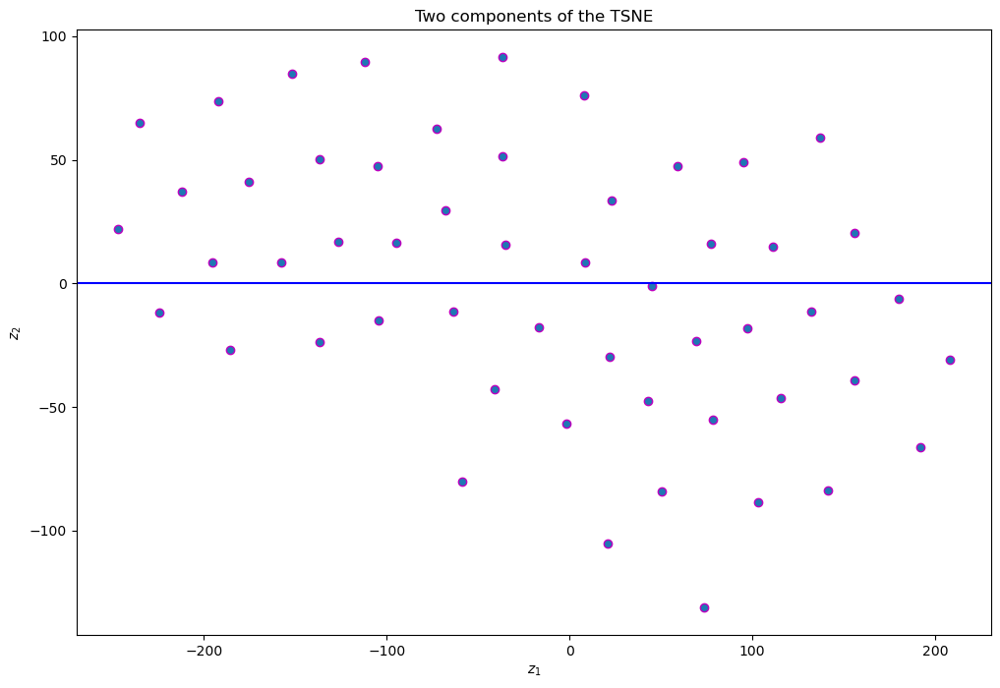

In [233]:
fig = plt.figure(figsize=(12,8))

plt.scatter(Data_TSNE[:,0], Data_TSNE[:,1], edgecolors="m")
plt.axhline(0, color="blue") 
plt.title('Two components of the TSNE')
plt.xlabel('$z_1$') 
plt.ylabel('$z_2$')
plt.show() 

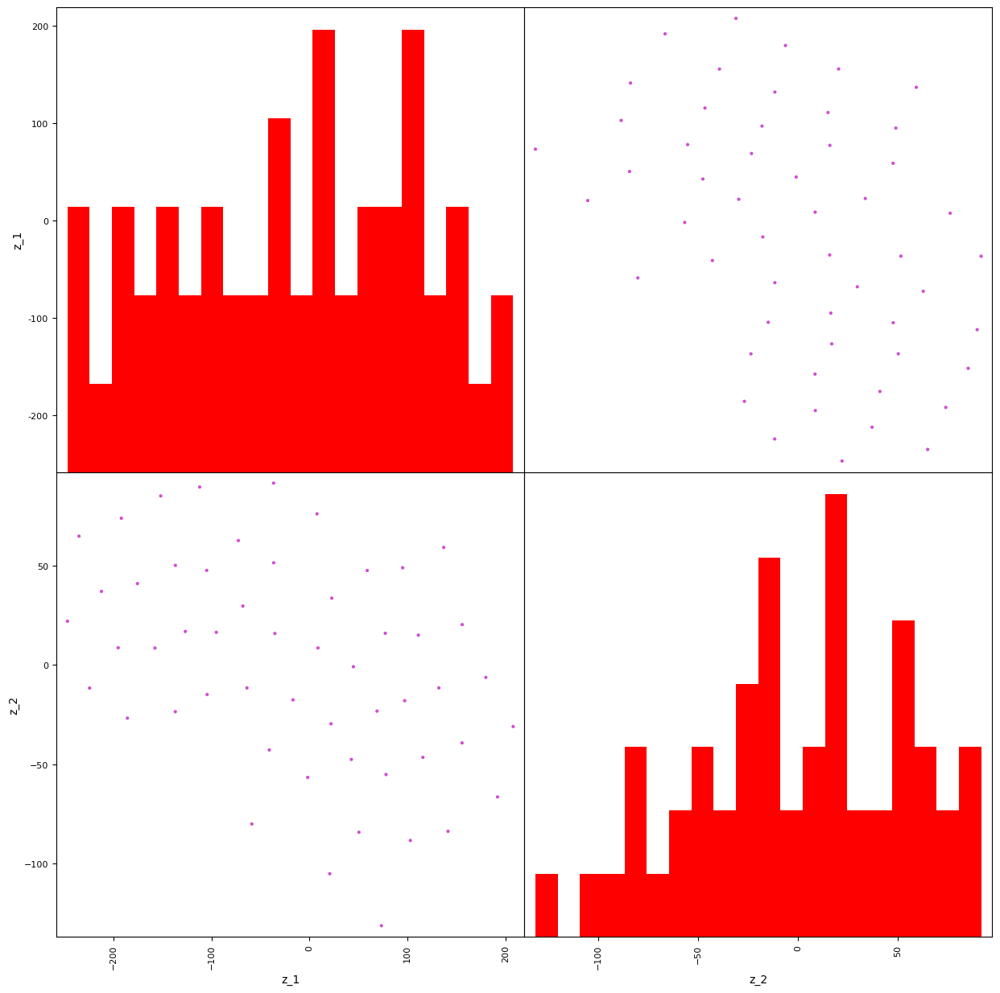

In [234]:
names = ["z_1", "z_2"]
X_Norm_tsne = pd.DataFrame(Data_TSNE, columns = names)
pd.plotting.scatter_matrix(X_Norm_tsne, alpha=0.7, figsize=(15,15),
                           color = 'm', hist_kwds = {'bins':20, 'color':'red'}) 
plt.show()

For n_clusters = 2 The average silhouette_score is : -0.014897417417423757
For n_clusters = 3 The average silhouette_score is : -0.08506151014386558
For n_clusters = 4 The average silhouette_score is : -0.11152486178365462
For n_clusters = 5 The average silhouette_score is : -0.3066454896608338


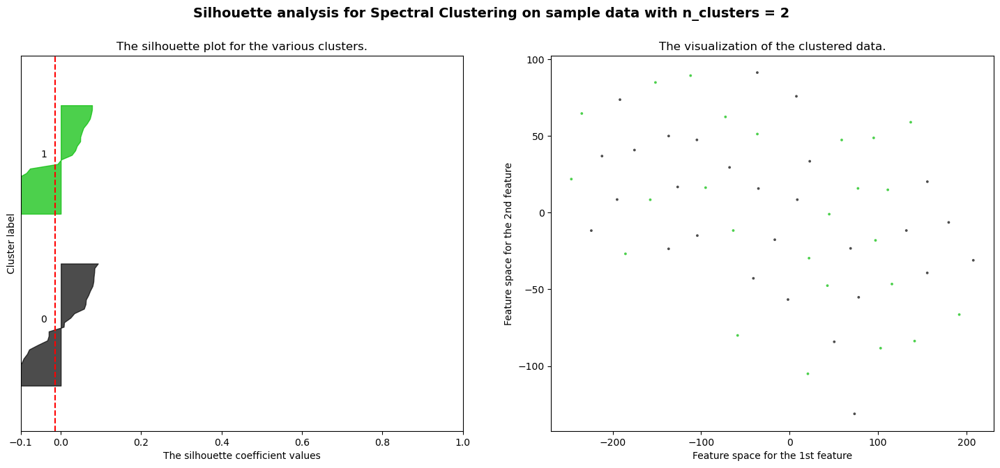

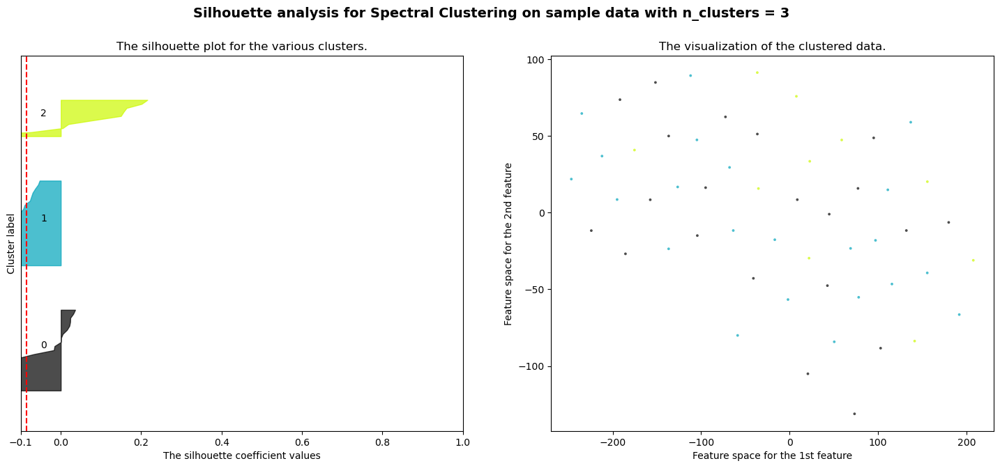

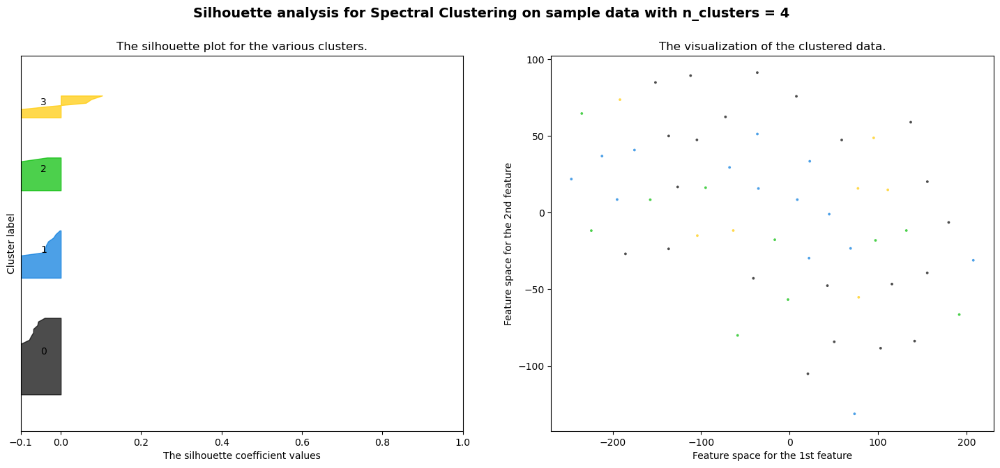

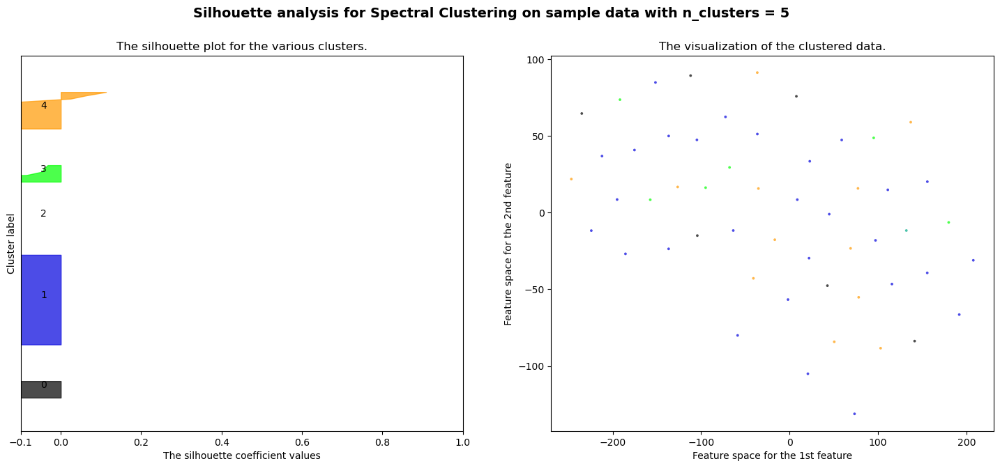

In [235]:
range_n_clusters = [2, 3, 4, 5]
X=Data_TSNE.copy()
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize KMeans
    Spectral = SpectralClustering(n_clusters=n_clusters)
    # fit the data & predict cluster labels
    cluster_Spectral = Spectral.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_Spectral)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_Spectral)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_Spectral == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_Spectral.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for Spectral Clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

For n_clusters = 2 The average silhouette_score is : 0.5167521110489858
For n_clusters = 3 The average silhouette_score is : 0.3928993699127664
For n_clusters = 4 The average silhouette_score is : 0.3457970322318265
For n_clusters = 5 The average silhouette_score is : 0.32761777290885297


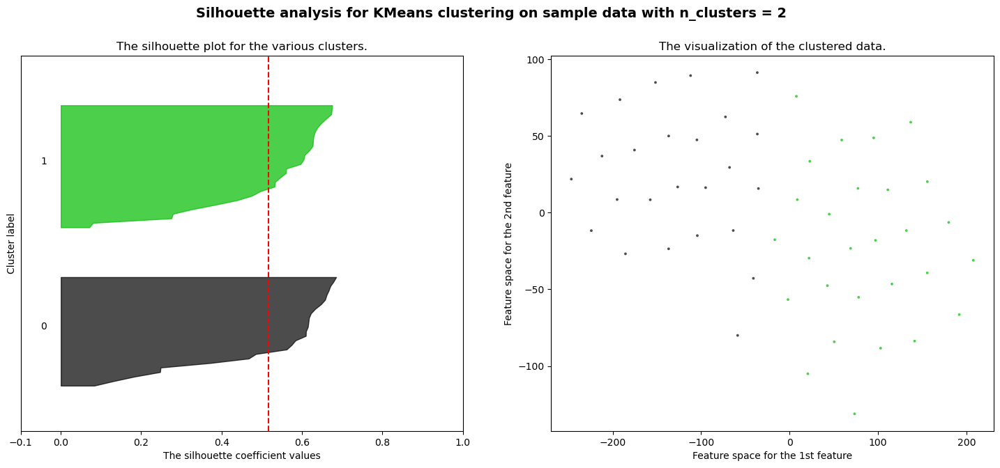

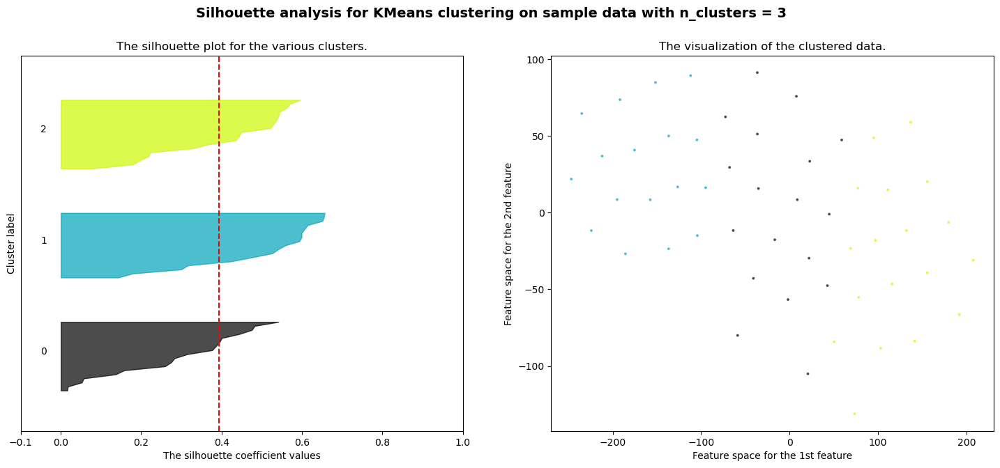

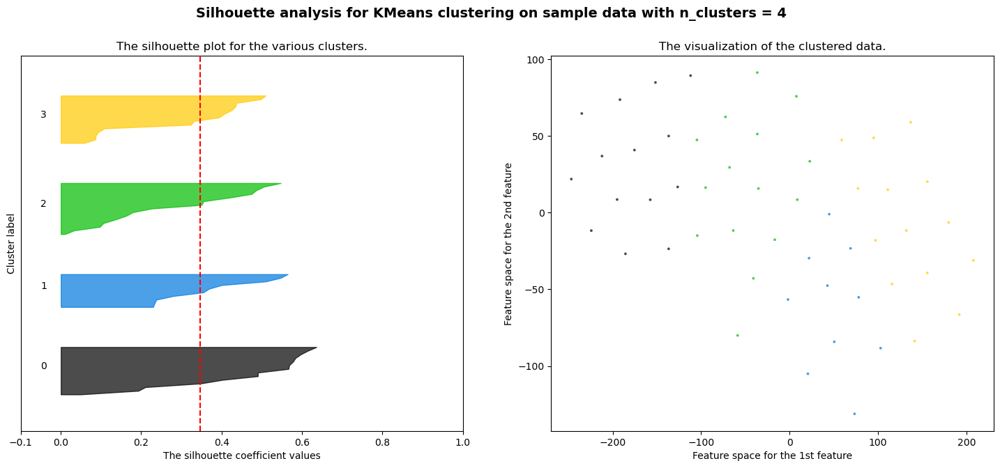

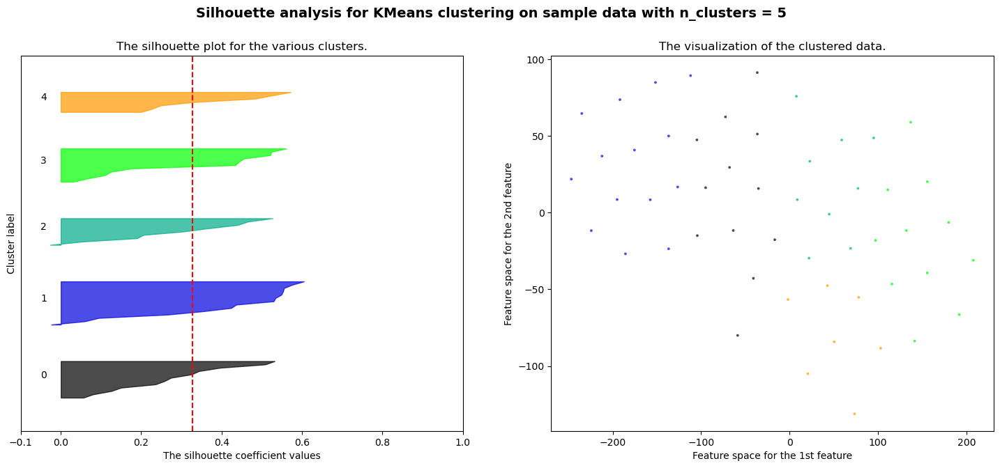

In [236]:
range_n_clusters = [2, 3, 4, 5]
X=Data_TSNE.copy()
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize KMeans
    kmeans = KMeans(n_clusters=n_clusters)
    # fit the data & predict cluster labels
    kmeans.fit(X)
    cluster_kmeans = kmeans.predict(X)

    silhouette_avg = silhouette_score(X, cluster_kmeans)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )
    
    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_kmeans)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_kmeans == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_kmeans.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

By performing a reduction with t sne and implementing a clustering with Kmeans, a good performance of the of the silhouette score is achieved from 2 to 5 clusters, the 2 cluster being the one with the best value.

The 28.30% of the observations fall into Cluster 1, materials number 15
The 26.42% of the observations fall into Cluster 2, materials number 14
The 26.42% of the observations fall into Cluster 3, materials number 14
The 18.87% of the observations fall into Cluster 4, materials number 10
1


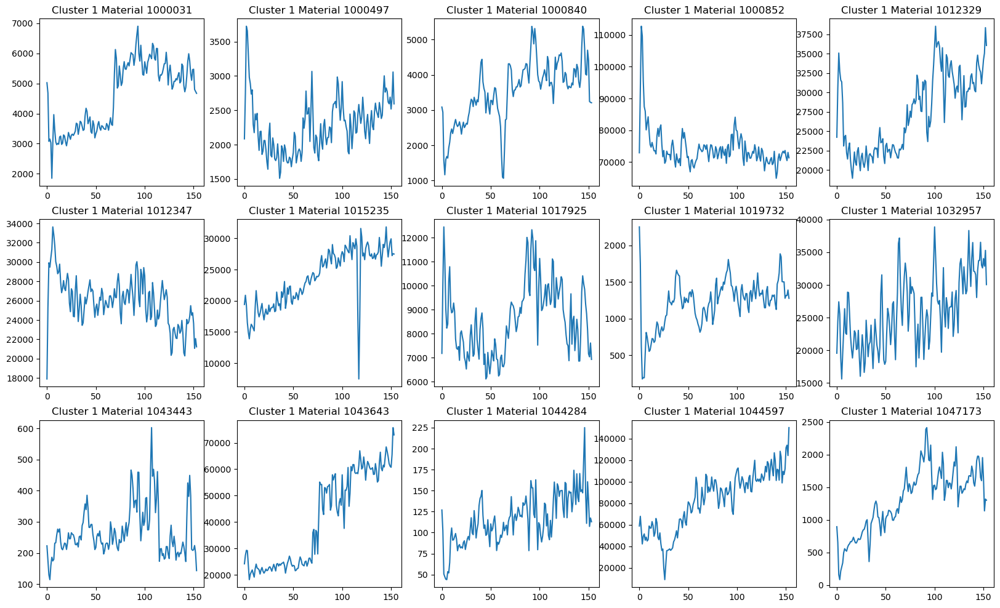

3


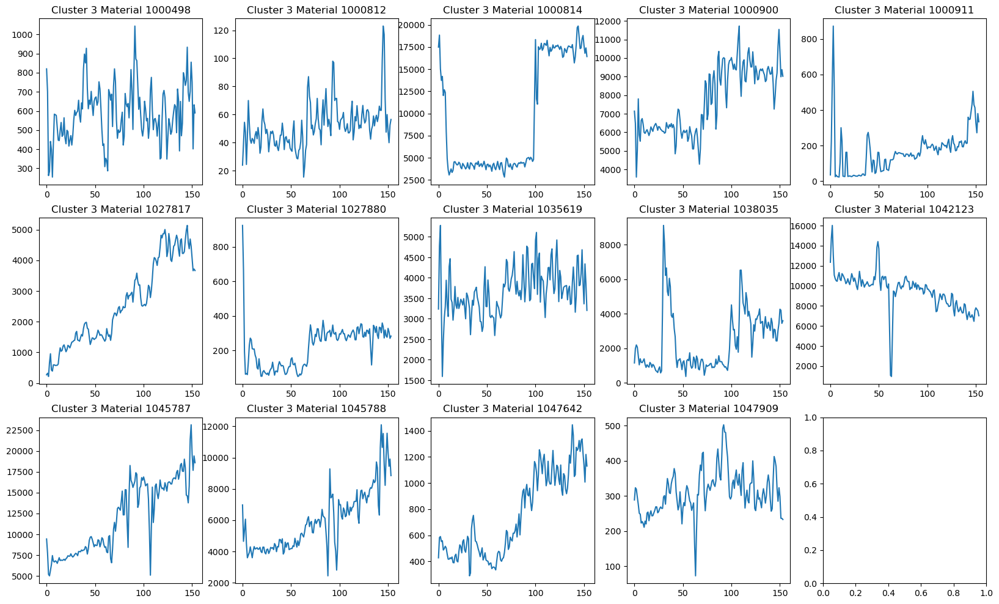

4


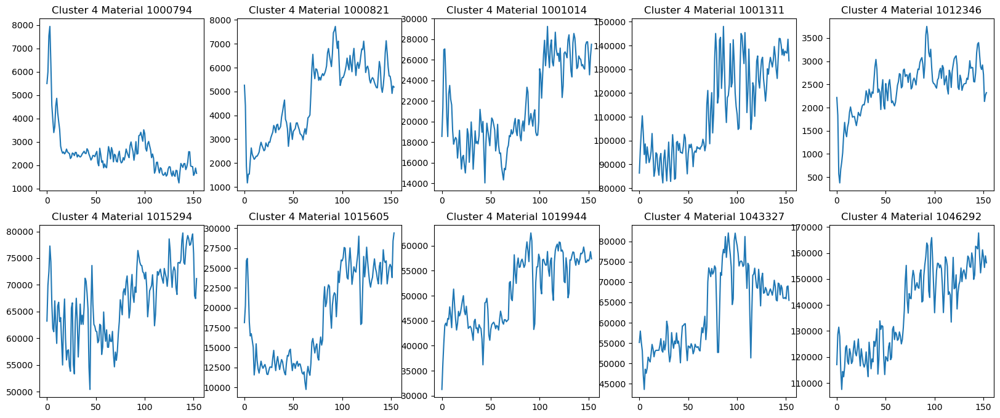

2


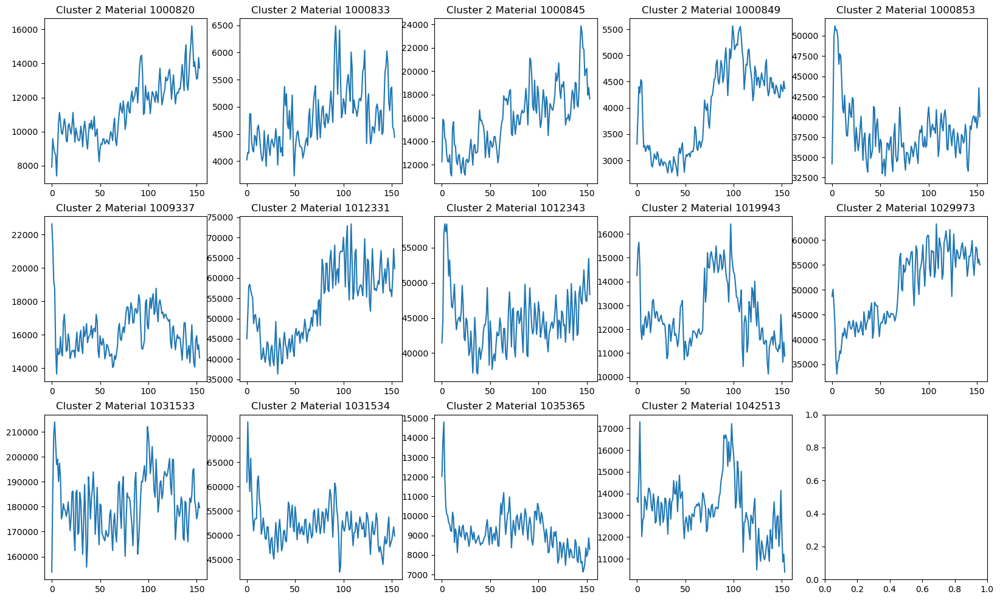

In [237]:
X=Data_TSNE.copy()
# Initialize KMeans
kmeans = KMeans(n_clusters=4)
# fit the data & predict cluster labels
kmeans.fit(X)
y_pred_mm_kmeans = kmeans.predict(X)

for i in range(len(np.unique(y_pred_mm_kmeans))):
    count = (sum(y_pred_mm_kmeans == i)/len(y_pred_mm_kmeans))*100
    print(f"The {count:.2f}% of the observations fall into Cluster {i + 1}, materials number {sum(y_pred_mm_kmeans == i)}")

Selected_Products_TSNE_Kmeans= Selected_Products_Moving_Mean.T.copy()
Selected_Products_TSNE_Kmeans=Selected_Products_TSNE_Kmeans.reset_index().rename(columns={'index': 'Materiales'})
Selected_Products_TSNE_Kmeans['Cluster'] = pd.Series(y_pred_mm_kmeans, dtype=int)

Selected_Products_TSNE_Kmeans_long = pd.melt(Selected_Products_TSNE_Kmeans, id_vars=['Materiales', 'Cluster'], var_name='Semana', value_name='Consumo')

# Get a list of unique clusters
clusters = Selected_Products_TSNE_Kmeans_long['Cluster'].unique()

# Create a graph for each cluster
for cluster in clusters:
    # Filter the dataframe by the current cluster
    df = Selected_Products_TSNE_Kmeans_long[Selected_Products_TSNE_Kmeans_long['Cluster'] == cluster]
    
    print(cluster+1)
    materials = df['Materiales'].unique()
    
    num_materials = len(materials)
    # Calculate the number of rows needed
    num_rows = int(num_materials / 5) if num_materials%5 == 0  else int(num_materials / 5) + 1  
    
    fig, axs = plt.subplots(num_rows, 5, figsize=(20, 4*num_rows)) 
    
    for i, material in enumerate(materials):
        # Filter the dataframe by the current cluster and the current material
        df_filter = df[df['Materiales'] == material]
        
        # Calculate the position of the graph in the matrix
        row = int(i / 5)
        col = i % 5
        
        # Create the graph in the corresponding position
        axs[row, col].plot(df_filter['Semana'], df_filter['Consumo'])
        axs[row, col].set_title(f'Cluster {cluster+1} Material {material}')
    
    plt.show()

The 52.83% of the observations fall into Cluster 1, materials number 28
The 47.17% of the observations fall into Cluster 2, materials number 25
2


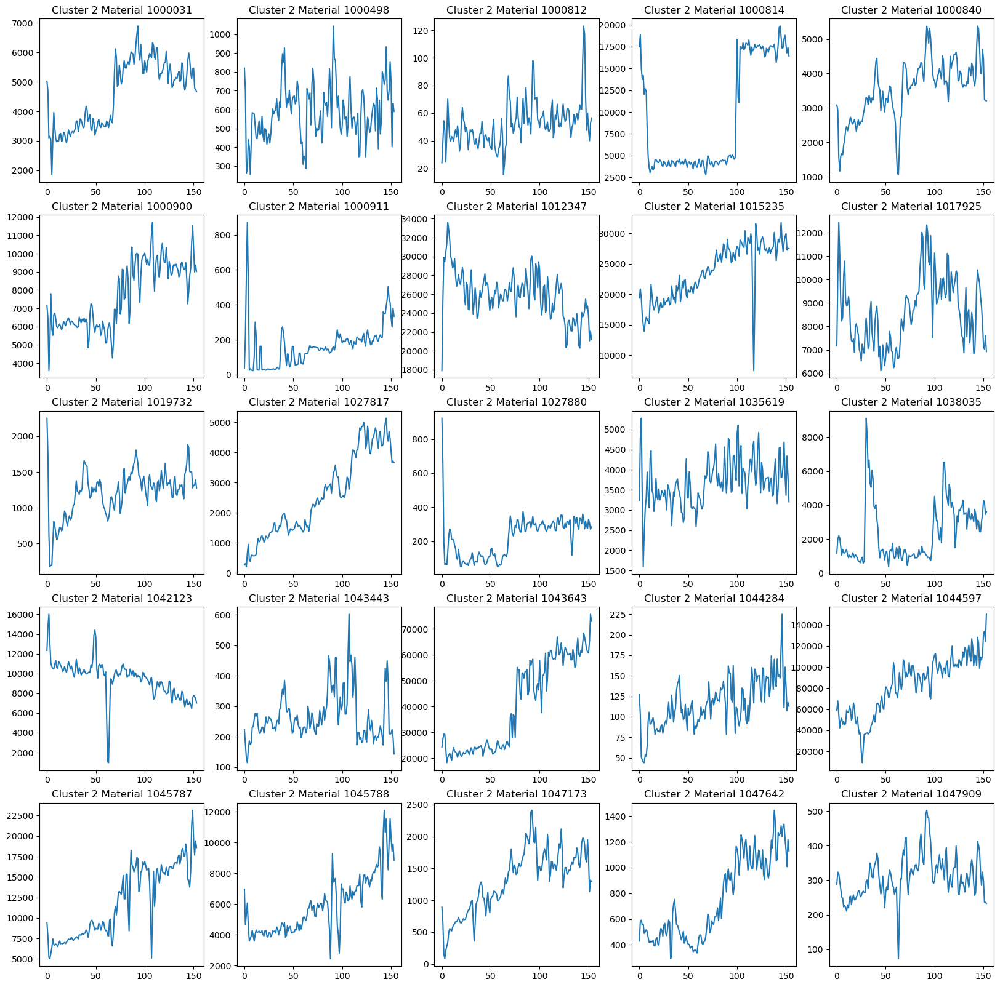

1


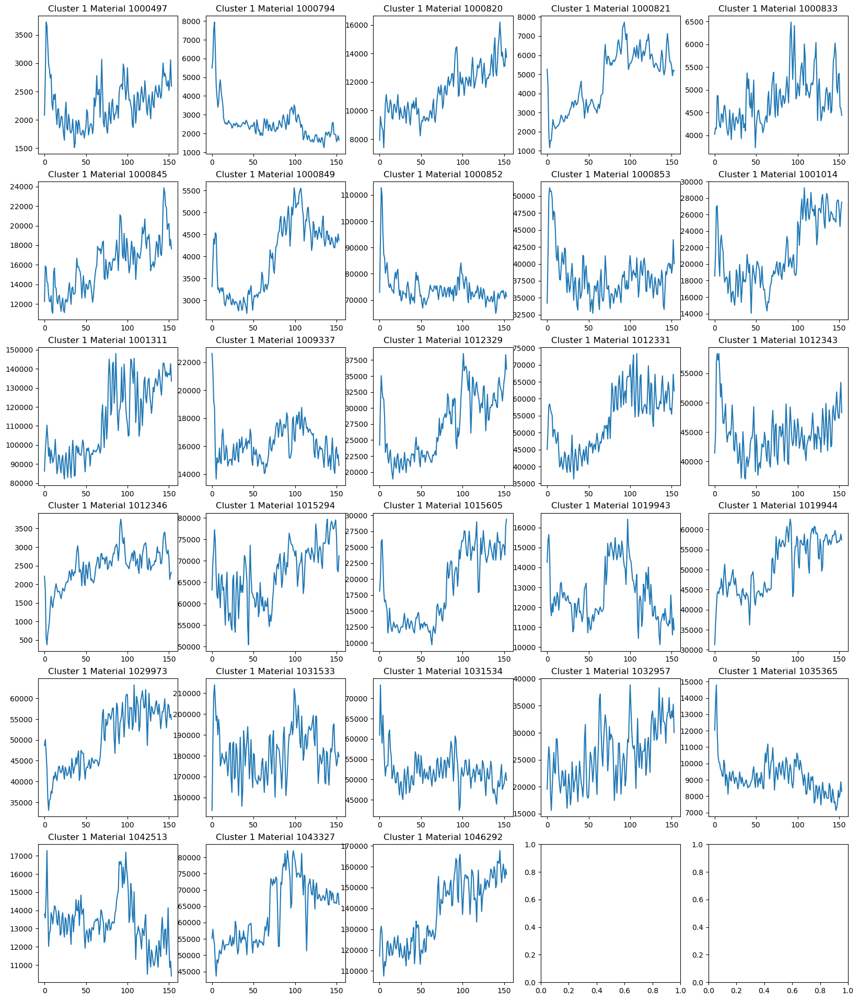

In [238]:
X=Data_TSNE.copy()
# Initialize KMeans
kmeans = KMeans(n_clusters=2)
# fit the data & predict cluster labels
kmeans.fit(X)
y_pred_mm_kmeans = kmeans.predict(X)

for i in range(len(np.unique(y_pred_mm_kmeans))):
    count = (sum(y_pred_mm_kmeans == i)/len(y_pred_mm_kmeans))*100
    print(f"The {count:.2f}% of the observations fall into Cluster {i + 1}, materials number {sum(y_pred_mm_kmeans == i)}")

Selected_Products_TSNE_Kmeans = Selected_Products_Moving_Mean.T.copy()
Selected_Products_TSNE_Kmeans = Selected_Products_TSNE_Kmeans.reset_index().rename(columns={'index': 'Materiales'})
Selected_Products_TSNE_Kmeans['Cluster'] = pd.Series(y_pred_mm_kmeans, dtype=int)

Selected_Products_TSNE_Kmeans_long = pd.melt(Selected_Products_TSNE_Kmeans, id_vars=['Materiales', 'Cluster'], var_name='Semana', value_name='Consumo')

# Get a list of unique clusters
clusters = Selected_Products_TSNE_Kmeans_long['Cluster'].unique()

# Create a graph for each cluster
for cluster in clusters:
    #   Filter the dataframe by the current cluster
    df = Selected_Products_TSNE_Kmeans_long[Selected_Products_TSNE_Kmeans_long['Cluster'] == cluster]
    
    print(cluster+1)
    materials = df['Materiales'].unique()
    
    num_materials = len(materials)
    num_rows = int(num_materials / 5) if num_materials%5 == 0  else int(num_materials / 5) + 1  
    
    fig, axs = plt.subplots(num_rows, 5, figsize=(20, 4*num_rows)) 
    
    for i, material in enumerate(materials):
        # Filter the dataframe by the current cluster and the current material
        df_filter = df[df['Materiales'] == material]
        
        # Calculate the position of the graph in the matrix
        row = int(i / 5)
        col = i % 5
        
        # Create the graph in the corresponding position
        axs[row, col].plot(df_filter['Semana'], df_filter['Consumo'])
        axs[row, col].set_title(f'Cluster {cluster+1} Material {material}')
    
    plt.show()